In [1]:
# change ORCA_PATH to the right path if you used a different path
# or specify the ORCA_PATH environmental variable
import os
import sys
if os.getenv("ORCA_PATH"):
    ORCA_PATH = os.getenv("ORCA_PATH")
else:
    ORCA_PATH = "../orca"
sys.path.append(ORCA_PATH)

In [2]:
import os
os.environ["CUDA_VISIBLE_DEVICES"]="0"
from IPython.core.pylabtools import figsize


In [3]:
import orca_predict 
orca_predict.load_resources(models=[],use_cuda=True)
from orca_predict import *
from orca_models import HCTnoc
hctnoc = HCTnoc()
hctnoc.eval()
hctnoc.cuda()

In <PYTHONPATH>/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The savefig.frameon rcparam was deprecated in Matplotlib 3.1 and will be removed in 3.3.
In <PYTHONPATH>/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The verbose.level rcparam was deprecated in Matplotlib 3.1 and will be removed in 3.3.
In <PYTHONPATH>/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The verbose.fileo rcparam was deprecated in Matplotlib 3.1 and will be removed in 3.3.


HCTnoc(
  (net): DataParallel(
    (module): Encoder2b(
      (lblocks): ModuleList(
        (0): Sequential(
          (0): MaxPool1d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
          (1): Conv1d(128, 128, kernel_size=(9,), stride=(1,), padding=(4,))
          (2): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (3): Conv1d(128, 128, kernel_size=(9,), stride=(1,), padding=(4,))
          (4): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
        (1): Sequential(
          (0): MaxPool1d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
          (1): Conv1d(128, 128, kernel_size=(9,), stride=(1,), padding=(4,))
          (2): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (3): Conv1d(128, 128, kernel_size=(9,), stride=(1,), padding=(4,))
          (4): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_run

In [4]:
import numpy as np
sequence_ = np.load('./resources/32m_seq.npy')
coord_ = np.load('./resources/32m_coor.npy')

In [5]:
#32Mb compartment activity screen at 9 locations

from collections import defaultdict

model=hctnoc
swapdiffs_all = defaultdict(lambda: defaultdict(list))
with torch.no_grad():
    sequence = torch.FloatTensor(sequence_[None,:]).clone()
    sequence_rc = torch.FloatTensor(sequence_[None,::-1,::-1].copy()).clone()
    seqT = torch.Tensor(sequence.float()).transpose(1,2).cuda()
    seqT_rc = torch.Tensor(sequence_rc.float()).transpose(1,2).cuda()
    encoding0 = (model.net0)(seqT)
    encoding0_rc = (model.net0)(seqT_rc)

    def eval_step(level, start, coarse_pred=None, plot=False):
        distenc=torch.log(torch.FloatTensor(model.normmats[level][None,None,:,:]).cuda()).expand(sequence.shape[0],1,250,
    250)
        if coarse_pred is not None:
            pred = model.denets[level].forward(encodings[level][:,:,int(start/level):int(start/level)+250], distenc, coarse_pred)
        else:
            pred = model.denets[level].forward(encodings[level][:,:,int(start/level):int(start/level)+250], distenc)
        return pred

    start = 0
    encoding1, encoding2, encoding4, encoding8, encoding16, encoding32 = model.net(encoding0)
    encodings = {1: encoding1, 2: encoding2, 4: encoding4, 8:encoding8, 16:encoding16, 32:encoding32}
    pred32 = eval_step(32, start)
    encoding1, encoding2, encoding4, encoding8, encoding16, encoding32 = model.net(encoding0_rc)
    encodings = {1: encoding1, 2: encoding2, 4: encoding4, 8:encoding8, 16:encoding16, 32:encoding32}
    pred32_rc = torch.flip(eval_step(32, start),[2,3])
    

    n=12800

    for j in np.arange(25,250,25):
        print(n,j)
        swapdiffs = []
        for k in range(int(32000000/n)):
            sequence2 = sequence.clone()
            sequence2[:,j*128000:(j)*128000+n,:]=sequence[:,k*n:(k+1)*n,:].clone()
            sequence2_rc = sequence_rc.clone()
            sequence2_rc[:,32000000-(j)*128000-n:32000000-j*128000:,:]=sequence_rc[:,32000000-(k+1)*n:32000000-k*n,:].clone()

            padding = 112000
            ind_padding = int(padding/4000)

            ind_s = int(np.ceil((j*128000-padding*2)/4000))
            ind_e = int(np.ceil(((j*128000+128000+padding*2)/4000)))

            seqT = torch.Tensor(sequence2[:,ind_s*4000:ind_e*4000,:].float()).transpose(1,2).cuda()
            seqT_rc = torch.Tensor(sequence2_rc[:,32000000-ind_e*4000:32000000-ind_s*4000,:].float()).transpose(1,2).cuda()
            encoding0_mut = encoding0.clone()
            encoding0_mut[:,:,ind_s+ind_padding:ind_e-ind_padding] = (model.net0)(seqT)[:,:,ind_padding:-ind_padding]
            
            encoding0_rc_mut = encoding0_rc.clone()
            encoding0_rc_mut[:,:,8000-ind_e+ind_padding:8000-ind_s-ind_padding] = (model.net0)(seqT_rc)[:,:,ind_padding:-ind_padding]
            

            def eval_step(level, start, coarse_pred=None, plot=False):
                distenc=torch.log(torch.FloatTensor(model.normmats[level][None,None,:,:]).cuda()).expand(sequence.shape[0],1,250,
            250)
                if coarse_pred is not None:
                    pred = model.denets[level].forward(encodings[level][:,:,int(start/level):int(start/level)+250], distenc, coarse_pred)
                else:
                    pred = model.denets[level].forward(encodings[level][:,:,int(start/level):int(start/level)+250], distenc)

                return pred

            start = 0
            encoding1, encoding2, encoding4, encoding8, encoding16, encoding32 = model.net(encoding0_mut)
            encodings = {1: encoding1, 2: encoding2, 4: encoding4, 8:encoding8, 16:encoding16, 32:encoding32}
            pred32_mut = eval_step(32, start)
            
            encoding1, encoding2, encoding4, encoding8, encoding16, encoding32 = model.net(encoding0_rc_mut)
            encodings = {1: encoding1, 2: encoding2, 4: encoding4, 8:encoding8, 16:encoding16, 32:encoding32}
            pred32_rc_mut = torch.flip(eval_step(32, start),[2,3])
            swapdiffs.append(torch.mean(torch.abs(0.5*pred32_mut[0,0,j,:]-0.5*pred32[0,0,j,:]+0.5*pred32_rc_mut[0,0,j,:]-0.5*pred32_rc[0,0,j,:])).item())
        swapdiffs_all[n][j].append(swapdiffs)


12800 25
12800 50
12800 75
12800 100
12800 125
12800 150
12800 175
12800 200
12800 225


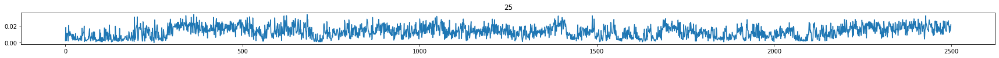

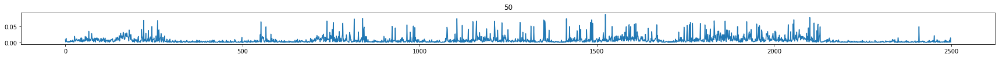

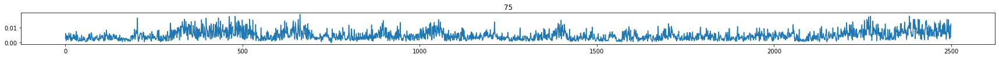

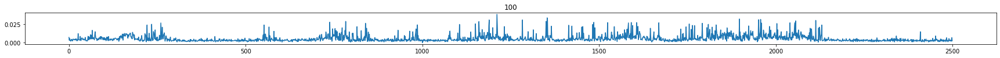

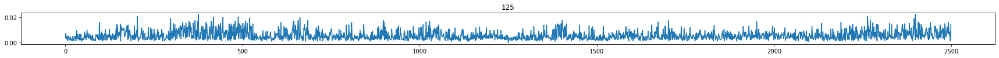

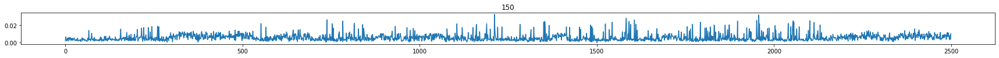

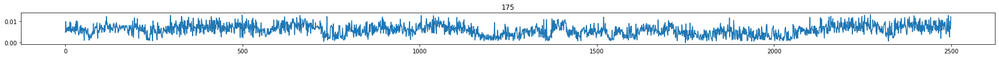

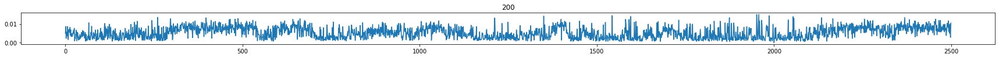

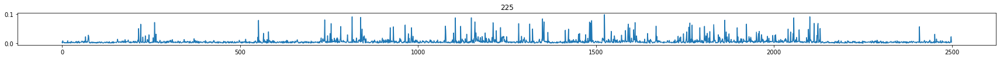

In [6]:
#visualization of the compartment profiles, which clearly show two patterns (B>A and A>B)
from matplotlib import pyplot as plt
from IPython.core.pylabtools import figsize
figsize(30,1)
n=12800
for j in np.arange(25,250,25):
    plt.figure()
    plt.plot(swapdiffs_all[n][j][0])
    plt.title(j)

In [7]:
torch.save({'swapdiffs_all': dict(swapdiffs_all)}, 
           './figure_data/swapdiff_.25_225.12800.pth')

In [8]:
coords = np.load('./resources/32m_coor.npy')
import pandas as pd
for j in np.arange(25,250,25):
    pd.DataFrame({'chr': np.repeat(coords[0], 2500),\
     'start':int(coords[1])-16000000 + np.arange(2500)*12800,\
     'end':int(coords[1])-16000000 + np.arange(1, 2501)*12800,\
    'score':  [i for i in swapdiffs_all[12800][j][0]]
    }).to_csv('./figure_data/swapdiff_.'+str(j)+'.12800.bedgraph', sep='\t', header=None,index=False)

In [9]:
%load_ext rpy2.ipython

R[write to console]: Loading required package: data.table

R[write to console]: data.table 1.12.2 using 36 threads (see ?getDTthreads).  Latest news: r-datatable.com

R[write to console]: Loading required package: ggplot2

R[write to console]: Need help getting started? Try the cookbook for R:
http://www.cookbook-r.com/Graphs/

R[write to console]: Loading required package: plyr

R[write to console]: Loading required package: scales



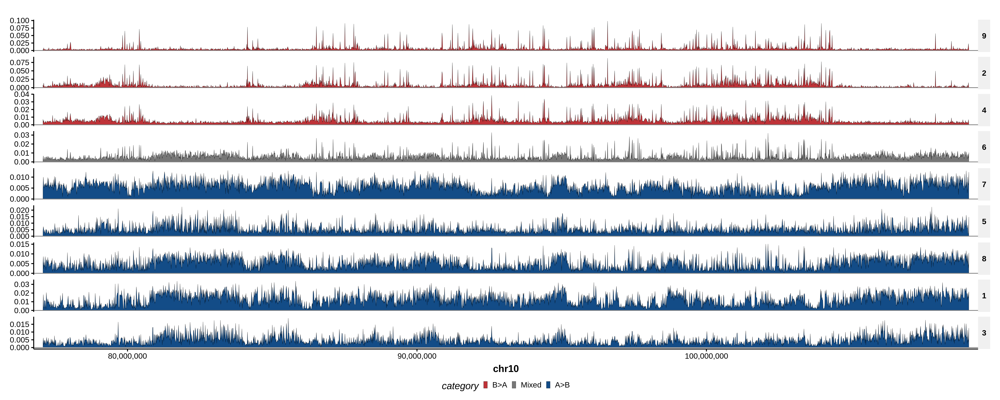

In [10]:
%%R -w 20 -h 8 --units in -r 300
#plot compartment activity profiles
require(data.table)
require(ggplot2)
swapdiffs = data.table()
for (i in seq(25,225,by=25)){
        swapdiff = fread(paste0('./figure_data/swapdiff_.',i,'.12800.bedgraph'))
        swapdiff$file = i
        swapdiffs = rbind(swapdiffs, swapdiff)
}
swapdiffs_pca = prcomp(dcast(V2~file,value.var = 'V4',data = swapdiffs)[,2:10])

options(repr.plot.width = 20, repr.plot.height = 8, repr.plot.res = 300)
options(bitmapType='cairo')
require(ggplot2)
require(plyr)
require(scales)

theme_Publication <- function(base_size=14, base_family="helvetica") {
      library(grid)
      library(ggthemes)
      (theme_foundation(base_size=base_size, base_family=base_family)
       + theme(plot.title = element_text(face = "bold",
                                         size = rel(1.2), hjust = 0.5),
               text = element_text(),
               panel.background = element_rect(colour = NA),
               plot.background = element_rect(colour = NA),
               panel.border = element_rect(colour = NA),
               axis.title = element_text(face = "bold",size = rel(1)),
               axis.title.y = element_text(angle=90,vjust =2),
               axis.title.x = element_text(vjust = -0.2),
               axis.text = element_text(), 
               axis.line = element_line(colour="black"),
               axis.ticks = element_line(),
               panel.grid.major = element_line(colour="#f0f0f0"),
               panel.grid.minor = element_blank(),
               legend.key = element_rect(colour = NA),
               legend.position = "bottom",
               legend.direction = "horizontal",
               legend.key.size= unit(0.2, "cm"),
               legend.margin = unit(0, "cm"),
               legend.title = element_text(face="italic"),
               plot.margin=unit(c(10,5,5,5),"mm"),
               strip.background=element_rect(colour="#f0f0f0",fill="#f0f0f0"),
               strip.text = element_text(face="bold")
          ))
      
}

scale_fill_Publication <- function(...){
      library(scales)
      discrete_scale("fill","Publication",manual_pal(values = c("#386cb0","#fdb462","#7fc97f","#ef3b2c","#662506","#a6cee3","#fb9a99","#984ea3","#ffff33")), ...)

}

scale_colour_Publication <- function(...){
      library(scales)
      discrete_scale("colour","Publication",manual_pal(values = c("#386cb0","#fdb462","#7fc97f","#ef3b2c","#662506","#a6cee3","#fb9a99","#984ea3","#ffff33")), ...)

}

plotdata = swapdiffs
colnames(plotdata)=c('chr','start','end','score','target')

plotdata$target = factor(plotdata$target, levels=c(225, 50, 100, 150, 175, 125, 200, 25,75))

plotdata$category = mapvalues(plotdata$target, c(225,50,100,175,125,200,150,75,25),
                              c("B>A","B>A","B>A","A>B","A>B","A>B","Mixed","A>B","A>B") )
plotdata$target_label = factor(as.numeric(as.character(plotdata$target))/25, 
                               levels=as.numeric(as.character(levels(plotdata$target)))/25)
p1= ggplot(plotdata)+geom_line(aes(x = (start+end)/2, y=score,color=category),size=0.2)+facet_grid(target_label~., scale='free_y')+
    geom_hline(yintercept=0, color='gray50')+scale_x_continuous(expand = c(0.01,0.01),label=comma)+
    theme_Publication()+scale_color_manual(values = c('#BF3338','#777777','#134C87'))+xlab('chr10')+
    theme(strip.text.y = element_text(angle = 0),panel.grid.major = element_blank(), 
          panel.grid.minor = element_blank())
p1
ggsave('./figures/compartment_activity.targets.example.pdf',width = 20,height = 8,dpi=300, device = cairo_pdf)
p2= ggplot(plotdata)+geom_ribbon(aes(x=(start+end)/2, ymin=0, ymax=score,fill=category),color=I('black'),size=I(0.1))+
    facet_grid(target_label~., scale='free_y')+
    geom_hline(yintercept=0, color='gray50')+scale_x_continuous(expand = c(0.01,0.01),label=comma)+
    theme_Publication()+scale_fill_manual(values = c('#BF3338','#777777','#134C87'))+xlab('chr10')+
    theme(strip.text.y = element_text(angle = 0),panel.grid.major = element_blank(), 
          panel.grid.minor = element_blank())
p2
ggsave('./figures/compartment_activity.targets.example.2.pdf',width = 20,height = 8,dpi=300, device = cairo_pdf)
p1
p2

In [11]:
#permute the source sequences with different segment lengths
def segpermute(seq, seglen):
    """
    Permute the sequence encoding `seq` by segments of length `seglen`
    """
    return seq.reshape((seq.shape[0],int(seq.shape[1]/seglen),seglen,4))[:,np.random.permutation(int(seq.shape[1]/seglen)),:,:].reshape((seq.shape[0],seq.shape[1],4))

from collections import defaultdict

model=hctnoc
swapdiffs_shuffled_all = defaultdict(lambda: defaultdict(list))

with torch.no_grad():
    sequence = torch.FloatTensor(sequence_[None,:,:]).clone()
    sequence_rc = torch.FloatTensor(sequence_[None,::-1,::-1].copy()).clone()
    seqT = torch.Tensor(sequence.float()).transpose(1,2).cuda()
    seqT_rc = torch.Tensor(sequence_rc.float()).transpose(1,2).cuda()
    encoding0 = (model.net0)(seqT)
    encoding0_rc = (model.net0)(seqT_rc)

    def eval_step(level, start, coarse_pred=None, plot=False):
        distenc=torch.log(torch.FloatTensor(model.normmats[level][None,None,:,:]).cuda()).expand(sequence.shape[0],1,250,
    250)
        if coarse_pred is not None:
            pred = model.denets[level].forward(encodings[level][:,:,int(start/level):int(start/level)+250], distenc, coarse_pred)
        else:
            pred = model.denets[level].forward(encodings[level][:,:,int(start/level):int(start/level)+250], distenc)
        return pred

    start = 0
    encoding1, encoding2, encoding4, encoding8, encoding16, encoding32 = model.net(encoding0)
    encodings = {1: encoding1, 2: encoding2, 4: encoding4, 8:encoding8, 16:encoding16, 32:encoding32}
    pred32 = eval_step(32, start)
    encoding1, encoding2, encoding4, encoding8, encoding16, encoding32 = model.net(encoding0_rc)
    encodings = {1: encoding1, 2: encoding2, 4: encoding4, 8:encoding8, 16:encoding16, 32:encoding32}
    pred32_rc = torch.flip(eval_step(32, start),[2,3])
    


    for n,j in zip([25600, 25600], [75, 225]):
        for seglen in [1,2,4,8,16,32,64,128,256,n]:
            print(n,j, seglen)
            swapdiffs = []
            for k in range(int(32000000/n)):
                sequence2 = sequence.clone()
                subseq = segpermute(sequence[:,k*n:(k+1)*n,:].numpy(),seglen)
                sequence2[:,j*128000:(j)*128000+n,:]=torch.FloatTensor(subseq.copy())
                sequence2_rc = sequence_rc.clone()
                sequence2_rc[:,32000000-(j)*128000-n:32000000-j*128000:,:]=torch.FloatTensor(subseq[:,::-1,::-1].copy())

                padding = 112000
                ind_padding = int(padding/4000)

                ind_s = int(np.ceil((j*128000-padding*2)/4000))
                ind_e = int(np.ceil(((j*128000+128000+padding*2)/4000)))

                seqT = torch.Tensor(sequence2[:,ind_s*4000:ind_e*4000,:].float()).transpose(1,2).cuda()
                seqT_rc = torch.Tensor(sequence2_rc[:,32000000-ind_e*4000:32000000-ind_s*4000,:].float()).transpose(1,2).cuda()
                encoding0_mut = encoding0.clone()
                encoding0_mut[:,:,ind_s+ind_padding:ind_e-ind_padding] = (model.net0)(seqT)[:,:,ind_padding:-ind_padding]

                encoding0_rc_mut = encoding0_rc.clone()
                encoding0_rc_mut[:,:,8000-ind_e+ind_padding:8000-ind_s-ind_padding] = (model.net0)(seqT_rc)[:,:,ind_padding:-ind_padding]


                def eval_step(level, start, coarse_pred=None, plot=False):
                    distenc=torch.log(torch.FloatTensor(model.normmats[level][None,None,:,:]).cuda()).expand(sequence.shape[0],1,250,
                250)
                    if coarse_pred is not None:
                        pred = model.denets[level].forward(encodings[level][:,:,int(start/level):int(start/level)+250], distenc, coarse_pred)
                    else:
                        pred = model.denets[level].forward(encodings[level][:,:,int(start/level):int(start/level)+250], distenc)

                    return pred

                start = 0
                encoding1, encoding2, encoding4, encoding8, encoding16, encoding32 = model.net(encoding0_mut)
                encodings = {1: encoding1, 2: encoding2, 4: encoding4, 8:encoding8, 16:encoding16, 32:encoding32}
                pred32_mut = eval_step(32, start)

                encoding1, encoding2, encoding4, encoding8, encoding16, encoding32 = model.net(encoding0_rc_mut)
                encodings = {1: encoding1, 2: encoding2, 4: encoding4, 8:encoding8, 16:encoding16, 32:encoding32}
                pred32_rc_mut = torch.flip(eval_step(32, start),[2,3])

                swapdiffs.append(torch.mean(torch.abs(0.5*pred32_mut[0,0,j,:]-0.5*pred32[0,0,j,:]+0.5*pred32_rc_mut[0,0,j,:]-0.5*pred32_rc[0,0,j,:])).item())
            swapdiffs_shuffled_all[seglen][j].append(swapdiffs)


25600 75 1
25600 75 2
25600 75 4
25600 75 8
25600 75 16
25600 75 32
25600 75 64
25600 75 128
25600 75 256
25600 75 25600
25600 225 1
25600 225 2
25600 225 4
25600 225 8
25600 225 16
25600 225 32
25600 225 64
25600 225 128
25600 225 256
25600 225 25600


In [12]:
torch.save(dict(swapdiffs_shuffled_all), './figure_data/swapdiffs_shuffled_all.pth')


In [13]:
import pandas as pd
c_scores = []
c_pos = []
c_shuf = []
c_target = []
for k in [2,4,8,16,32,64,128,256,25600]:
    for t in range(int(32000000/25600)):
        c_pos.append(t*25600+25600/2)
        c_shuf.append(k)
        c_target.append(75)
    c_scores.extend(swapdiffs_shuffled_all[k][75][0])
    for t in range(int(32000000/25600)):
        c_pos.append(t*25600+25600/2)
        c_shuf.append(k)
        c_target.append(225)
    c_scores.extend(swapdiffs_shuffled_all[k][225][0])
plotdata = pd.DataFrame(dict(score=c_scores, pos=c_pos, shuf=c_shuf, target=c_target))

R[write to console]: Loading required package: ggridges

R[write to console]: Loading required package: ggrastr

R[write to console]: Loading required package: patchwork

R[write to console]: Saving 15 x 7 in image



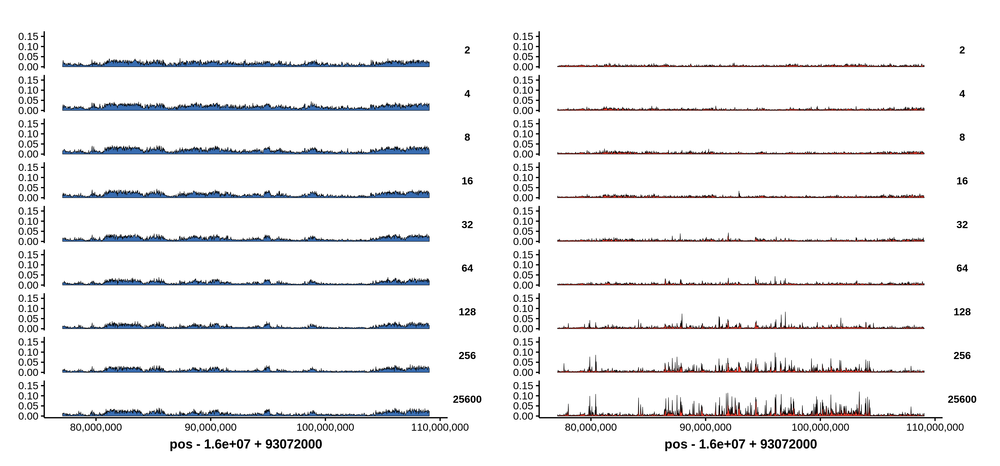

In [14]:
%%R -i plotdata -w 15 -h 7 --units in -r 300
#Plot effects of permutation on compartment activity. 
#A compartment activity but not B compartment is sensitive to permutation

theme_Publication <- function(base_size=14, base_family="Helvetica") {
      library(grid)
      library(ggthemes)
      (theme_foundation(base_size=base_size, base_family=base_family)
       + theme(plot.title = element_text(face = "bold",
                                         size = rel(1.2), hjust = 0.5),
               text = element_text(),
               panel.background = element_rect(colour = NA),
               plot.background = element_rect(colour = NA),
               panel.border = element_rect(colour = NA),
               axis.title = element_text(face = "bold",size = rel(1)),
               axis.title.y = element_text(angle=90,vjust =2),
               axis.title.x = element_text(vjust = -0.2),
               axis.text = element_text(), 
               axis.line = element_line(colour="black"),
               axis.ticks = element_line(),
               panel.grid.major = element_blank(),
               panel.grid.minor = element_blank(),
               legend.key = element_rect(colour = NA),
               legend.position = "bottom",
               legend.direction = "horizontal",
               legend.key.size= unit(0.2, "cm"),
               legend.margin = unit(0, "cm"),
               legend.title = element_text(face="italic"),
               plot.margin=unit(c(10,5,5,5),"mm"),
               strip.background=element_rect(colour="#ffffff",fill="#ffffff"),
               strip.text = element_text(face="bold")
          ))
      
}



require(ggplot2)
require(ggridges)
require(ggrastr)
require(scales)
require(data.table)
require(patchwork)
plotdata = data.table(plotdata)
plotdata$group = factor(as.integer(plotdata$pos / (plotdata$len*30000)))
plotdata$shuffactor = factor(plotdata$shuf)
p1 = ggplot(plotdata[target==75 ,])+geom_ribbon(aes(x=pos-16000000+93072000, ymin=0, ymax=score, group= group),color=I('black'),fill=I("#386cb0"),size=I(0.2))+
theme_Publication()+facet_grid(shuffactor~.)+ylim(0,0.167)+scale_x_continuous(label=comma)+theme(strip.text.y = element_text(angle = 0))
p2 = ggplot(plotdata[target==225,])+geom_ribbon(aes(x=pos-16000000+93072000, ymin=0, ymax=score, group= group),color=I('black'),fill=I("#ef3b2c"),size=I(0.2))+
theme_Publication()+facet_grid(shuffactor~.)+ylim(0,0.167)+scale_x_continuous(label=comma)+theme(strip.text.y = element_text(angle = 0))
p1 + p2
ggsave('./figures/compartment_activity.shuflengths.pdf',device = cairo_pdf)
p1 + p2

In [15]:
#AT proportion and B compartment activity
c_pos = []
for t in range(int(32000000/25600)):
    c_pos.append(t*25600+25600/2)
plotdata = pd.DataFrame(dict(pos=c_pos, score=sequence_.reshape(1250,25600,4).mean(axis=1)[:,[0,3]].mean(axis=1)))

R[write to console]: Warning:
R[write to console]:  Ignoring unknown parameters: fill

R[write to console]: Saving 7 x 1.5 in image



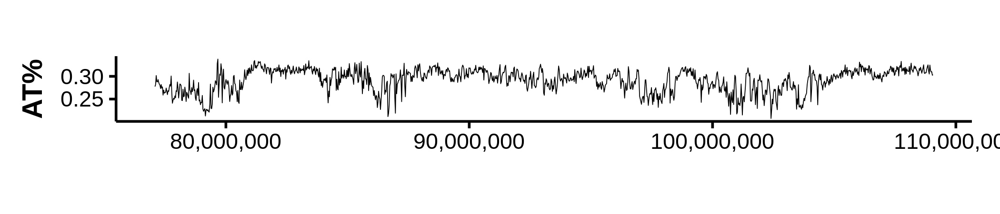

In [16]:
%%R -i plotdata -w 7 -h 1.5 --units in -r 300
#plot AT proporition for comparison of B compartment activity
theme_Publication <- function(base_size=14, base_family="Helvetica") {
      library(grid)
      library(ggthemes)
      (theme_foundation(base_size=base_size, base_family=base_family)
       + theme(plot.title = element_text(face = "bold",
                                         size = rel(1.2), hjust = 0.5),
               text = element_text(),
               panel.background = element_rect(colour = NA),
               plot.background = element_rect(colour = NA),
               panel.border = element_rect(colour = NA),
               axis.title = element_text(face = "bold",size = rel(1)),
               axis.title.y = element_text(angle=90,vjust =2),
               axis.title.x = element_text(vjust = -0.2),
               axis.text = element_text(), 
               axis.line = element_line(colour="black"),
               axis.ticks = element_line(),
               panel.grid.major = element_blank(),
               panel.grid.minor = element_blank(),
               legend.key = element_rect(colour = NA),
               legend.position = "bottom",
               legend.direction = "horizontal",
               legend.key.size= unit(0.2, "cm"),
               legend.margin = unit(0, "cm"),
               legend.title = element_text(face="italic"),
               plot.margin=unit(c(10,5,5,5),"mm"),
               strip.background=element_rect(colour="#ffffff",fill="#ffffff"),
               strip.text = element_text(face="bold")
          ))
      
}



require(ggplot2)
require(ggridges)
require(ggrastr)
require(scales)
require(data.table)
require(patchwork)
plotdata = data.table(plotdata)
plotdata$group = factor(as.integer(plotdata$pos / (plotdata$len*30000)))
plotdata$shuffactor = factor(plotdata$shuf)
p1 = ggplot(plotdata)+geom_line(aes(x=pos-16000000+93072000,y=score),color=I('black'),fill=I("#386cb0"),size=I(0.2))+
theme_Publication()+scale_x_continuous(label=comma)+ylab('AT%')+xlab('')
p1 
ggsave('./figures/compartment_activity.shuflengths.at.pdf',device = cairo_pdf)
p1

In [17]:
#Effects of permuting extended regions (1.28Mb)

def segpermute(seq, seglen):
    return seq.reshape((seq.shape[0],int(seq.shape[1]/seglen),seglen,4))[:,np.random.permutation(int(seq.shape[1]/seglen)),:,:].reshape((seq.shape[0],seq.shape[1],4))

from collections import defaultdict

model=hctnoc

shufmuts  = []
for s in np.arange(10, 240, 10):
    with torch.no_grad():
        sequence = torch.FloatTensor(sequence_[None,:,:]).clone()
        sequence_rc = torch.FloatTensor(sequence_[None,::-1,::-1].copy()).clone()
        seqT = torch.Tensor(sequence.float()).transpose(1,2).cuda()
        seqT_rc = torch.Tensor(sequence_rc.float()).transpose(1,2).cuda()
        encoding0 = (model.net0)(seqT)
        encoding0_rc = (model.net0)(seqT_rc)

        def eval_step(level, start, coarse_pred=None, plot=False):
            distenc=torch.log(torch.FloatTensor(model.normmats[level][None,None,:,:]).cuda()).expand(sequence.shape[0],1,250,
        250)
            if coarse_pred is not None:
                pred = model.denets[level].forward(encodings[level][:,:,int(start/level):int(start/level)+250], distenc, coarse_pred)
            else:
                pred = model.denets[level].forward(encodings[level][:,:,int(start/level):int(start/level)+250], distenc)
            return pred

        start = 0
        encoding1, encoding2, encoding4, encoding8, encoding16, encoding32 = model.net(encoding0)
        encodings = {1: encoding1, 2: encoding2, 4: encoding4, 8:encoding8, 16:encoding16, 32:encoding32}
        pred32 = eval_step(32, start)
        encoding1, encoding2, encoding4, encoding8, encoding16, encoding32 = model.net(encoding0_rc)
        encodings = {1: encoding1, 2: encoding2, 4: encoding4, 8:encoding8, 16:encoding16, 32:encoding32}
        pred32_rc = torch.flip(eval_step(32, start),[2,3])


        n=1280000
        for seglen in [2]:
            for j in [s]:
                print(n,j)

                sequence2 = sequence.clone()
                #subseq = segpermute(sequence[:,200*128000:(200)*128000+n,:].numpy(),seglen)
                subseq = segpermute(sequence[:,j*128000:(j)*128000+n,:].numpy(),4)
                sequence2[:,j*128000:(j)*128000+n,:]=torch.FloatTensor(subseq.copy())
                sequence2_rc = sequence_rc.clone()
                sequence2_rc[:,32000000-(j)*128000-n:32000000-j*128000:,:]=torch.FloatTensor(subseq[:,::-1,::-1].copy())

                padding = 112000
                ind_padding = int(padding/4000)

                ind_s = int(np.ceil((j*128000-padding*2)/4000))
                ind_e = int(np.ceil(((j*128000+n+padding*2)/4000)))

                seqT = torch.Tensor(sequence2[:,ind_s*4000:ind_e*4000,:].float()).transpose(1,2).cuda()
                seqT_rc = torch.Tensor(sequence2_rc[:,32000000-ind_e*4000:32000000-ind_s*4000,:].float()).transpose(1,2).cuda()
                encoding0_mut = encoding0.clone()
                encoding0_mut[:,:,ind_s+ind_padding:ind_e-ind_padding] = (model.net0)(seqT)[:,:,ind_padding:-ind_padding]

                encoding0_rc_mut = encoding0_rc.clone()
                encoding0_rc_mut[:,:,8000-ind_e+ind_padding:8000-ind_s-ind_padding] = (model.net0)(seqT_rc)[:,:,ind_padding:-ind_padding]


                def eval_step(level, start, coarse_pred=None, plot=False):
                    distenc=torch.log(torch.FloatTensor(model.normmats[level][None,None,:,:]).cuda()).expand(sequence.shape[0],1,250,
                250)
                    if coarse_pred is not None:
                        pred = model.denets[level].forward(encodings[level][:,:,int(start/level):int(start/level)+250], distenc, coarse_pred)
                    else:
                        pred = model.denets[level].forward(encodings[level][:,:,int(start/level):int(start/level)+250], distenc)

                    return pred

                start = 0
                encoding1, encoding2, encoding4, encoding8, encoding16, encoding32 = model.net(encoding0_mut)
                encodings = {1: encoding1, 2: encoding2, 4: encoding4, 8:encoding8, 16:encoding16, 32:encoding32}
                pred32_mut = eval_step(32, start)

                encoding1, encoding2, encoding4, encoding8, encoding16, encoding32 = model.net(encoding0_rc_mut)
                encodings = {1: encoding1, 2: encoding2, 4: encoding4, 8:encoding8, 16:encoding16, 32:encoding32}
                pred32_rc_mut = torch.flip(eval_step(32, start),[2,3])

    print(torch.mean(torch.abs(0.5*pred32_mut[0,0,j,:]-0.5*pred32[0,0,j,:]+0.5*pred32_rc_mut[0,0,j,:]-0.5*pred32_rc[0,0,j,:])).item())
    shufmuts.append(pred32_mut.cpu().detach().numpy().squeeze()*0.5+pred32_rc_mut.cpu().detach().numpy().squeeze()*0.5)


1280000 10
0.11052980273962021
1280000 20
0.2255009263753891
1280000 30
0.08459145575761795
1280000 40
0.038317225873470306
1280000 50
0.08063305914402008
1280000 60
0.0626712515950203
1280000 70
0.12972939014434814
1280000 80
0.26619696617126465
1280000 90
0.18934912979602814
1280000 100
0.13385458290576935
1280000 110
0.21006439626216888
1280000 120
0.27932295203208923
1280000 130
0.23037442564964294
1280000 140
0.15322914719581604
1280000 150
0.1504073441028595
1280000 160
0.22793135046958923
1280000 170
0.15240855515003204
1280000 180
0.16955973207950592
1280000 190
0.10770592093467712
1280000 200
0.17080429196357727
1280000 210
0.24984228610992432
1280000 220
0.06378393620252609
1280000 230
0.05383593216538429


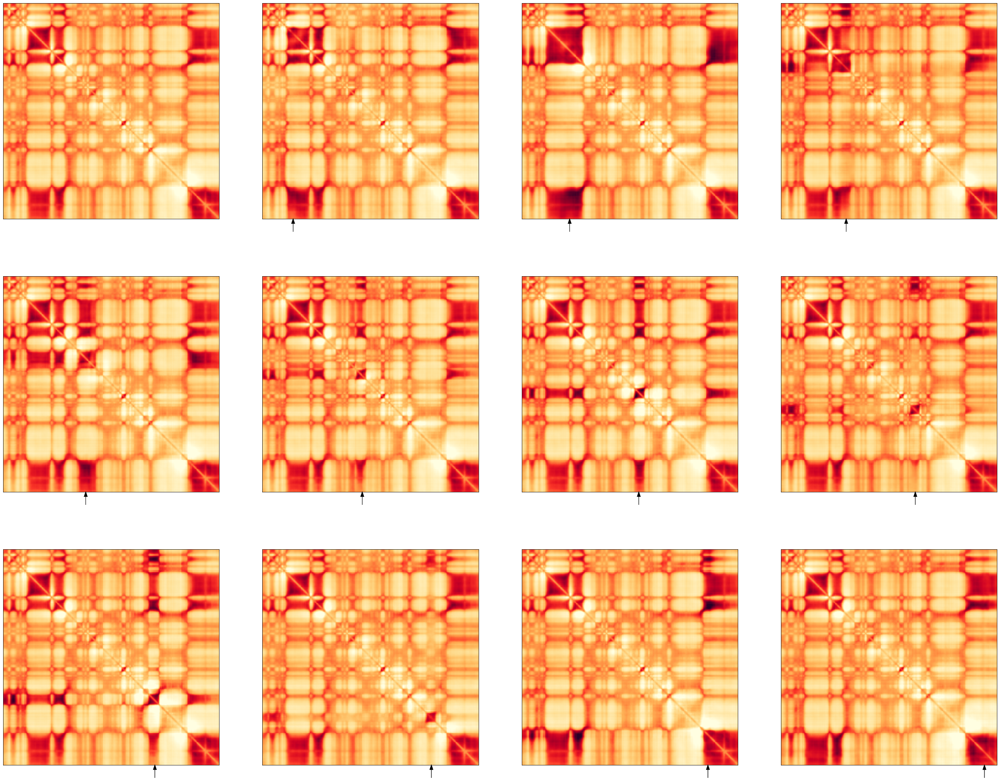

In [18]:
#plot extended region permutation effects
#first panel shows the reference, arrows indicate permutation positions
from colormaps import hnh_cmap_ext5
figsize(40,32)
fig, axs = plt.subplots(3,4)
spositions = np.arange(10, 240, 10)
for i, ax in enumerate(axs.flat):
    if i == 0:
        ax.imshow(pred32.cpu().detach().numpy().squeeze()*0.5+pred32_rc.cpu().detach().numpy().squeeze()*0.5,
          cmap=hnh_cmap_ext5, vmax=0.7, vmin=-0.45)
    else:
        ax.imshow(shufmuts[i*2],
                  cmap=hnh_cmap_ext5, vmax=0.7, vmin=-0.45)

        ax.annotate('', fontsize=20, xy=(spositions[i*2]+5, 249),
                xycoords='data', xytext=(0, -30),
                textcoords='offset points',
                arrowprops=dict(width=0.5, headwidth = 8.,
                                linewidth = 0.5,color = 'black'))
    ax.tick_params(axis='both', which='both', labelbottom=False, labelleft=False, bottom=False,left=False)
plt.savefig('./figures/compartment_activity.shufexamples.1.28M.pdf')

In [19]:
#Fine mapping the position and length dependencies of A compartment activity with a series of smaller segment sizes

from collections import defaultdict
j=225

model=hctnoc
swaplengths = defaultdict(list)

with torch.no_grad():
    sequence = torch.FloatTensor(sequence_[None,:]).clone()
    sequence_rc = torch.FloatTensor(sequence_[None,::-1,::-1].copy()).clone()
    seqT = torch.Tensor(sequence.float()).transpose(1,2).cuda()
    seqT_rc = torch.Tensor(sequence_rc.float()).transpose(1,2).cuda()
    encoding0 = (model.net0)(seqT)
    encoding0_rc = (model.net0)(seqT_rc)

    def eval_step(level, start, coarse_pred=None, plot=False):
        distenc=torch.log(torch.FloatTensor(model.normmats[level][None,None,:,:]).cuda()).expand(sequence.shape[0],1,250,
    250)
        if coarse_pred is not None:
            pred = model.denets[level].forward(encodings[level][:,:,int(start/level):int(start/level)+250], distenc, coarse_pred)
        else:
            pred = model.denets[level].forward(encodings[level][:,:,int(start/level):int(start/level)+250], distenc)
        return pred

    start = 0
    encoding1, encoding2, encoding4, encoding8, encoding16, encoding32 = model.net(encoding0)
    encodings = {1: encoding1, 2: encoding2, 4: encoding4, 8:encoding8, 16:encoding16, 32:encoding32}
    pred32 = eval_step(32, start)
    encoding1, encoding2, encoding4, encoding8, encoding16, encoding32 = model.net(encoding0_rc)
    encodings = {1: encoding1, 2: encoding2, 4: encoding4, 8:encoding8, 16:encoding16, 32:encoding32}
    pred32_rc = torch.flip(eval_step(32, start),[2,3])
    

    n = 12800
    for segl in [50, 100, 200, 400, 800, 1600, 3200, 6400, 12800]:
        for k in np.argsort(-np.array(torch.load('./figure_data/swapdiff_.25_225.12800.pth')['swapdiffs_all'][12800][225][0]))[:10]:
            print(segl, k)
            for t in  np.arange(0 - int(segl/2), n-int(segl/2)+1,16):
                sequence2 = sequence.clone()
                sequence2[:,j*128000:j*128000+segl,:]=sequence[:,k*n+t:k*n+t+segl,:]
                sequence2_rc = sequence_rc.clone()
                sequence2_rc[:,32000000-(j)*128000-segl:32000000-j*128000:,:]=sequence_rc[:,32000000-(k*n+t+segl):32000000-(k*n+t),:].clone()


                padding = 112000
                ind_padding = int(padding/4000)

                ind_s = int(np.ceil((j*128000-padding*2)/4000))
                ind_e = int(np.ceil(((j*128000+128000+padding*2)/4000)))

                seqT = torch.Tensor(sequence2[:,ind_s*4000:ind_e*4000,:].float()).transpose(1,2).cuda()
                seqT_rc = torch.Tensor(sequence2_rc[:,32000000-ind_e*4000:32000000-ind_s*4000,:].float()).transpose(1,2).cuda()
                encoding0_mut = encoding0.clone()
                encoding0_mut[:,:,ind_s+ind_padding:ind_e-ind_padding] = (model.net0)(seqT)[:,:,ind_padding:-ind_padding]

                encoding0_rc_mut = encoding0_rc.clone()
                encoding0_rc_mut[:,:,8000-ind_e+ind_padding:8000-ind_s-ind_padding] = (model.net0)(seqT_rc)[:,:,ind_padding:-ind_padding]


                def eval_step(level, start, coarse_pred=None, plot=False):
                    distenc=torch.log(torch.FloatTensor(model.normmats[level][None,None,:,:]).cuda()).expand(sequence.shape[0],1,250,
                250)
                    if coarse_pred is not None:
                        pred = model.denets[level].forward(encodings[level][:,:,int(start/level):int(start/level)+250], distenc, coarse_pred)
                    else:
                        pred = model.denets[level].forward(encodings[level][:,:,int(start/level):int(start/level)+250], distenc)

                    return pred

                start = 0
                encoding1, encoding2, encoding4, encoding8, encoding16, encoding32 = model.net(encoding0_mut)
                encodings = {1: encoding1, 2: encoding2, 4: encoding4, 8:encoding8, 16:encoding16, 32:encoding32}
                pred32_mut = eval_step(32, start)

                encoding1, encoding2, encoding4, encoding8, encoding16, encoding32 = model.net(encoding0_rc_mut)
                encodings = {1: encoding1, 2: encoding2, 4: encoding4, 8:encoding8, 16:encoding16, 32:encoding32}
                pred32_rc_mut = torch.flip(eval_step(32, start),[2,3])

                swaplengths[segl].append(torch.mean(torch.abs(0.5*pred32_mut[0,0,j,:]-0.5*pred32[0,0,j,:]+0.5*pred32_rc_mut[0,0,j,:]-0.5*pred32_rc[0,0,j,:])).item())


50 1524
50 2101
50 815
50 839
50 1150
50 2056
50 1105
50 1350
50 738
50 1862
100 1524
100 2101
100 815
100 839
100 1150
100 2056
100 1105
100 1350
100 738
100 1862
200 1524
200 2101
200 815
200 839
200 1150
200 2056
200 1105
200 1350
200 738
200 1862
400 1524
400 2101
400 815
400 839
400 1150
400 2056
400 1105
400 1350
400 738
400 1862
800 1524
800 2101
800 815
800 839
800 1150
800 2056
800 1105
800 1350
800 738
800 1862
1600 1524
1600 2101
1600 815
1600 839
1600 1150
1600 2056
1600 1105
1600 1350
1600 738
1600 1862
3200 1524
3200 2101
3200 815
3200 839
3200 1150
3200 2056
3200 1105
3200 1350
3200 738
3200 1862
6400 1524
6400 2101
6400 815
6400 839
6400 1150
6400 2056
6400 1105
6400 1350
6400 738
6400 1862
12800 1524
12800 2101
12800 815
12800 839
12800 1150
12800 2056
12800 1105
12800 1350
12800 738
12800 1862


In [20]:
torch.save({'swaplengths': dict(swaplengths)}, 
           './figure_data/swaplengths.pth')

In [21]:
c_scores = []
c_target = []
c_pos = []
c_len = []
n = 12800
for segl in [50, 100, 200, 400, 800, 1600, 3200, 6400, 12800]:
    for k in np.argsort(-np.array(torch.load('./figure_data/swapdiff_.25_225.12800.pth')['swapdiffs_all'][12800][225][0]))[:10]:
        for t in  np.arange(0 - int(segl/2), n-int(segl/2)+1,16):
            c_target.append(k)
            c_pos.append(t+segl/2)
            c_len.append(segl)
    c_scores.extend(swaplengths[segl])
plotdata = pd.DataFrame(dict(score=c_scores, target=c_target, pos=c_pos, len=c_len))

In [22]:
cumscores = defaultdict(lambda : np.zeros(12800))
for segl in [50, 100, 200, 400, 800]:
    for j, k in enumerate(np.argsort(-np.array(torch.load('./figure_data/swapdiff_.25_225.12800.pth')['swapdiffs_all'][12800][225][0]))[:10]):
        for i, t in  enumerate(np.arange(0 - int(segl/2), n-int(segl/2)+1,16)):
            cumscores[k][np.fmax(t,0):np.fmax(t+segl,0)] += np.reshape(swaplengths[segl],(10,-1))[j,i]/segl

[7520, 2528, 912, 6784, 6464, 7662, 4944, 11006, 3470, 7351]


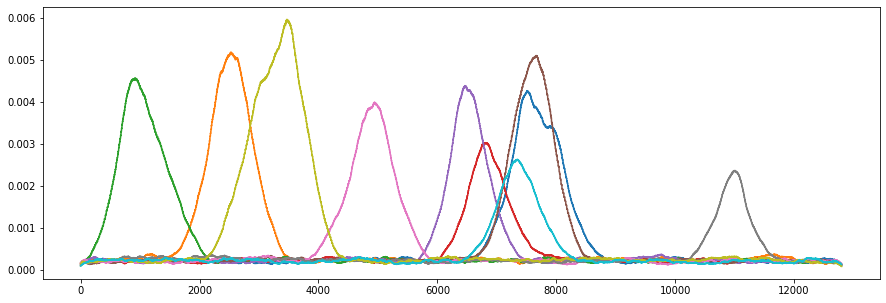

In [23]:
#plot compartment A activity with high resolution 
figsize(15,5)
cumscores_argmax = []
for k in cumscores.keys():
    plt.plot(cumscores[k])
    cumscores_argmax.append(np.argmax(cumscores[k]))
print(cumscores_argmax)
    

In [24]:
#redo fine mapping centered at the peak positions 
from collections import defaultdict
j=225

model=hctnoc
swaplengths_centered = defaultdict(list)

with torch.no_grad():
    sequence = torch.FloatTensor(sequence_[None,:,:]).clone()
    sequence_rc = torch.FloatTensor(sequence_[None,::-1,::-1].copy()).clone()
    seqT = torch.Tensor(sequence.float()).transpose(1,2).cuda()
    seqT_rc = torch.Tensor(sequence_rc.float()).transpose(1,2).cuda()
    encoding0 = (model.net0)(seqT)
    encoding0_rc = (model.net0)(seqT_rc)

    def eval_step(level, start, coarse_pred=None, plot=False):
        distenc=torch.log(torch.FloatTensor(model.normmats[level][None,None,:,:]).cuda()).expand(sequence.shape[0],1,250,
    250)
        if coarse_pred is not None:
            pred = model.denets[level].forward(encodings[level][:,:,int(start/level):int(start/level)+250], distenc, coarse_pred)
        else:
            pred = model.denets[level].forward(encodings[level][:,:,int(start/level):int(start/level)+250], distenc)
        return pred

    start = 0
    encoding1, encoding2, encoding4, encoding8, encoding16, encoding32 = model.net(encoding0)
    encodings = {1: encoding1, 2: encoding2, 4: encoding4, 8:encoding8, 16:encoding16, 32:encoding32}
    pred32 = eval_step(32, start)
    encoding1, encoding2, encoding4, encoding8, encoding16, encoding32 = model.net(encoding0_rc)
    encodings = {1: encoding1, 2: encoding2, 4: encoding4, 8:encoding8, 16:encoding16, 32:encoding32}
    pred32_rc = torch.flip(eval_step(32, start),[2,3])

    n = 12800
    for segl in [50, 100, 200, 400, 800, 1600, 3200, 6400, 12800]:
        for k, maxpos in zip(np.argsort(-np.array(torch.load('./figure_data/swapdiff_.25_225.12800.pth')['swapdiffs_all'][12800][225][0]))[:10],
                     cumscores_argmax):
            print(segl, k)
            for t in  np.arange(0 - int(segl/2) + maxpos - int(n/2), n-int(segl/2)+1+ maxpos - int(n/2),16):
                sequence2 = sequence.clone()
                sequence2[:,j*128000:j*128000+segl,:]=sequence[:,k*n+t:k*n+t+segl,:]
                sequence2_rc = sequence_rc.clone()
                sequence2_rc[:,32000000-(j)*128000-segl:32000000-j*128000:,:]=sequence_rc[:,32000000-(k*n+t+segl):32000000-(k*n+t),:].clone()


                padding = 112000
                ind_padding = int(padding/4000)

                ind_s = int(np.ceil((j*128000-padding*2)/4000))
                ind_e = int(np.ceil(((j*128000+128000+padding*2)/4000)))

                seqT = torch.Tensor(sequence2[:,ind_s*4000:ind_e*4000,:].float()).transpose(1,2).cuda()
                seqT_rc = torch.Tensor(sequence2_rc[:,32000000-ind_e*4000:32000000-ind_s*4000,:].float()).transpose(1,2).cuda()
                encoding0_mut = encoding0.clone()
                encoding0_mut[:,:,ind_s+ind_padding:ind_e-ind_padding] = (model.net0)(seqT)[:,:,ind_padding:-ind_padding]

                encoding0_rc_mut = encoding0_rc.clone()
                encoding0_rc_mut[:,:,8000-ind_e+ind_padding:8000-ind_s-ind_padding] = (model.net0)(seqT_rc)[:,:,ind_padding:-ind_padding]


                def eval_step(level, start, coarse_pred=None, plot=False):
                    distenc=torch.log(torch.FloatTensor(model.normmats[level][None,None,:,:]).cuda()).expand(sequence.shape[0],1,250,
                250)
                    if coarse_pred is not None:
                        pred = model.denets[level].forward(encodings[level][:,:,int(start/level):int(start/level)+250], distenc, coarse_pred)
                    else:
                        pred = model.denets[level].forward(encodings[level][:,:,int(start/level):int(start/level)+250], distenc)

                    return pred

                start = 0
                encoding1, encoding2, encoding4, encoding8, encoding16, encoding32 = model.net(encoding0_mut)
                encodings = {1: encoding1, 2: encoding2, 4: encoding4, 8:encoding8, 16:encoding16, 32:encoding32}
                pred32_mut = eval_step(32, start)

                encoding1, encoding2, encoding4, encoding8, encoding16, encoding32 = model.net(encoding0_rc_mut)
                encodings = {1: encoding1, 2: encoding2, 4: encoding4, 8:encoding8, 16:encoding16, 32:encoding32}
                pred32_rc_mut = torch.flip(eval_step(32, start),[2,3])

                swaplengths_centered[segl].append(torch.mean(torch.abs(0.5*pred32_mut[0,0,j,:]-0.5*pred32[0,0,j,:]+0.5*pred32_rc_mut[0,0,j,:]-0.5*pred32_rc[0,0,j,:])).item())


50 1524
50 2101
50 815
50 839
50 1150
50 2056
50 1105
50 1350
50 738
50 1862
100 1524
100 2101
100 815
100 839
100 1150
100 2056
100 1105
100 1350
100 738
100 1862
200 1524
200 2101
200 815
200 839
200 1150
200 2056
200 1105
200 1350
200 738
200 1862
400 1524
400 2101
400 815
400 839
400 1150
400 2056
400 1105
400 1350
400 738
400 1862
800 1524
800 2101
800 815
800 839
800 1150
800 2056
800 1105
800 1350
800 738
800 1862
1600 1524
1600 2101
1600 815
1600 839
1600 1150
1600 2056
1600 1105
1600 1350
1600 738
1600 1862
3200 1524
3200 2101
3200 815
3200 839
3200 1150
3200 2056
3200 1105
3200 1350
3200 738
3200 1862
6400 1524
6400 2101
6400 839
6400 1150
6400 2056
6400 1105
6400 1350
6400 738
6400 1862
12800 1524
12800 2101
12800 815
12800 839
12800 1150
12800 2056
12800 1105
12800 1350
12800 738
12800 1862


In [25]:
torch.save({'swaplengths_centered': dict(swaplengths_centered)}, 
           './figure_data/swaplengths_centered.pth')

In [26]:
#swaplengths = torch.load( './figure_data/swaplengths..pth')['swaplengths']
#swaplengths_centered = torch.load( './figure_data/swaplengths_centered.pth')['swaplengths_centered']

In [27]:
#centered
c_scores = []
c_target = []
c_pos = []
c_len = []
c_pos_abs = []
for segl in [50, 100, 200, 400, 800, 1600, 3200, 6400, 12800]:
    for k, maxpos in zip(np.argsort(-np.array(torch.load('./figure_data/swapdiff_.25_225.12800.pth')['swapdiffs_all'][12800][225][0]))[:5],
                 cumscores_argmax[:5]):
        for t in  np.arange(0 - int(segl/2) + maxpos - int(n/2), n-int(segl/2)+1+ maxpos - int(n/2),16):
            c_pos.append(t+segl/2-maxpos)
            c_pos_abs.append(93072000-16000000+12800*k + maxpos)
            c_len.append(segl)
    c_scores.extend(swaplengths_centered[segl][:(len(c_len)-len(c_scores))])
plotdata = pd.DataFrame(dict(score=c_scores, pos=c_pos, coordinate=c_pos_abs, len=c_len))

In [28]:
compartment_a_activity_positions = 93072000-16000000+12800*np.argsort(-np.array(torch.load('./figure_data/swapdiff_.25_225.12800.pth')['swapdiffs_all'][12800][225][0]))[:5]+cumscores_argmax[:5]

In [29]:
import pyBigWig
pbw = pyBigWig.open("./resources/FANTOM5_max_counts.le2.fwd.bw")
mbw = pyBigWig.open("./resources/FANTOM5_max_counts.le2.rev.bw")

c_scores = []
c_pos = []
c_len = []
c_pos_abs=[]
for pos in compartment_a_activity_positions:
    ptss = np.array(pbw.values('chr10', pos-3200, pos+3200))
    mtss = np.array(mbw.values('chr10', pos-3200, pos+3200))
    ptss[np.isnan(ptss)] = 0
    mtss[np.isnan(mtss)] = 0
    c_scores.append(ptss.tolist())
    c_pos.append(np.arange( pos-3200, pos+3200))
    c_pos_abs.append(np.repeat(pos, 6400))
    c_len.append(np.repeat('TSS_P',6400))
    
    c_scores.append(mtss.tolist())
    c_pos.append(np.arange( pos-3200, pos+3200))
    c_pos_abs.append(np.repeat(pos, 6400))
    c_len.append(np.repeat('TSS_M',6400))
    
plotdata_tss = pd.DataFrame(dict(score=np.concatenate(c_scores),  \
                                 pos=np.concatenate(c_pos),\
                                 coordinate=np.concatenate(c_pos_abs), 
                                 len=np.concatenate(c_len)))

[1] 6400


R[write to console]: Saving 5 x 6 in image



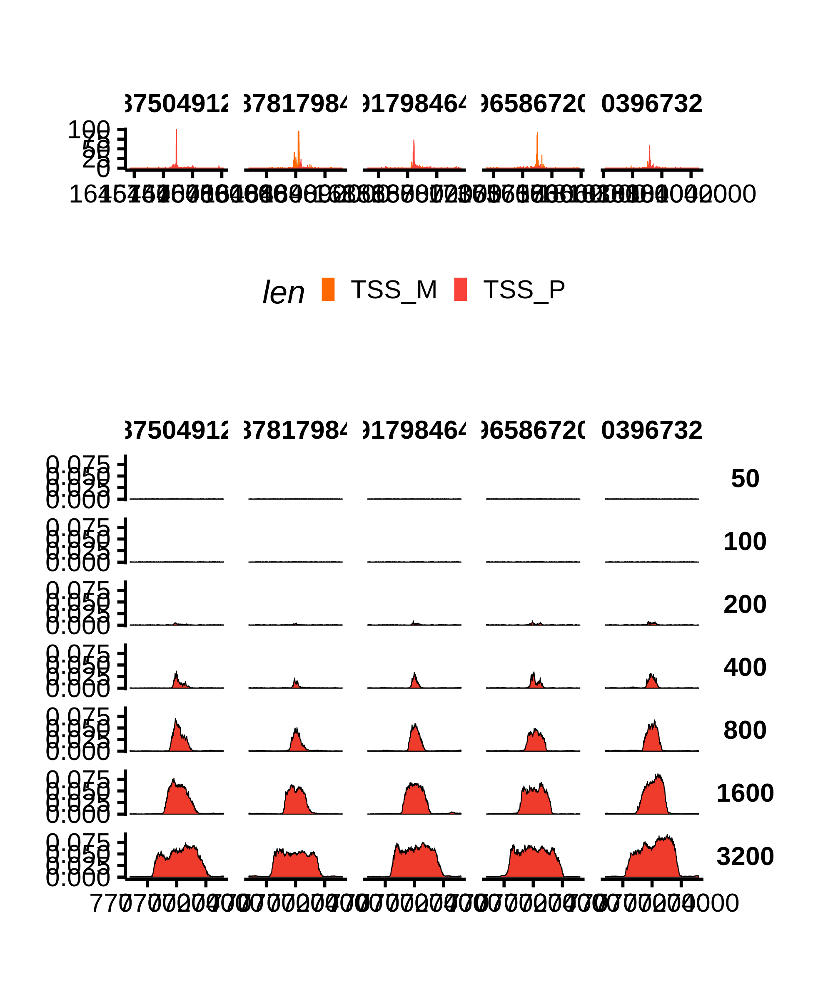

In [30]:
%%R -i plotdata,plotdata_tss -w 5 -h 6 --units in -r 400
#plot compartment A activity for 5 top sites in comparison with TSS signal

require(ggplot2)
require(ggridges)

theme_Publication <- function(base_size=14, base_family="Helvetica") {
      library(grid)
      library(ggthemes)
      (theme_foundation(base_size=base_size, base_family=base_family)
       + theme(plot.title = element_text(face = "bold",
                                         size = rel(1.2), hjust = 0.5),
               text = element_text(),
               panel.background = element_rect(colour = NA),
               plot.background = element_rect(colour = NA),
               panel.border = element_rect(colour = NA),
               axis.title = element_text(face = "bold",size = rel(1)),
               axis.title.y = element_text(angle=90,vjust =2),
               axis.title.x = element_text(vjust = -0.2),
               axis.text = element_text(), 
               axis.line = element_line(colour="black"),
               axis.ticks = element_line(),
               panel.grid.major = element_blank(),
               panel.grid.minor = element_blank(),
               legend.key = element_rect(colour = NA),
               legend.position = "bottom",
               legend.direction = "horizontal",
               legend.key.size= unit(0.2, "cm"),
               legend.margin = unit(0, "cm"),
               legend.title = element_text(face="italic"),
               plot.margin=unit(c(10,5,5,5),"mm"),
               strip.background=element_rect(colour="#ffffff",fill="#ffffff"),
               strip.text = element_text(face="bold")
          ))
      
}



p1=ggplot(plotdata_tss)+
    geom_ribbon(aes(x=pos-16000000+93072000, ymin=0, ymax=score,color=len,fill=len),
                                               size=I(0.2))+
    facet_grid(~coordinate, scale='free_x')+theme_minimal()+scale_y_continuous(limits=c(0,100))+
    theme_Publication()+theme(strip.text.y = element_text(angle=0))+xlab('')+
    scale_fill_manual(values=c('#FF6800','#F94239'))+scale_color_manual(values=c('#FF6800','#F94239'))



p2= ggplot(plotdata[plotdata$len<=3200 & abs(plotdata$pos)<=3200,])+
    geom_ribbon(aes(x=pos-16000000+93072000, ymin=0, ymax=score),
                                               color=I('black'),fill=I("#ef3b2c"),size=I(0.2))+
    facet_grid(len~coordinate, scale='free_x')+
    theme_Publication()+theme(strip.text.y = element_text(angle=0))+xlab('')

p1/p2+ plot_layout(heights = c(1,10))
ggsave('./figures/compartment_activity.lengths.centered_examples.pdf',device = cairo_pdf)
p1/p2+ plot_layout(heights = c(1,10))

INFO:pygenometracks.tracksClass:initialize 1. [x-axis]
INFO:pygenometracks.tracksClass:initialize 2. [spacer]
INFO:pygenometracks.tracksClass:initialize 3. [test gtf collapsed]
INFO:pygenometracks.tracksClass:initialize 4. [spacer]
INFO:pygenometracks.tracksClass:initialize 5. [bigwig file]
INFO:pygenometracks.tracksClass:initialize 6. [bigwig file]
INFO:pygenometracks.tracksClass:time initializing track(s):
INFO:pygenometracks.tracksClass:1.5512208938598633
DEBUG:pygenometracks.tracksClass:Figure size in cm is 15.0 x 10.212765957446809. Dpi is set to 600

INFO:pygenometracks.tracksClass:plotting 1. [x-axis]
INFO:pygenometracks.tracksClass:plotting 2. [spacer]
INFO:pygenometracks.tracksClass:plotting 3. [test gtf collapsed]
DEBUG:pygenometracks.tracks.GenomeTrack:ylim 5.68,-0.08
INFO:pygenometracks.tracksClass:plotting 4. [spacer]
INFO:pygenometracks.tracksClass:plotting 5. [bigwig file]
INFO:pygenometracks.tracksClass:plotting 6. [bigwig file]
INFO:pygenometracks.tracksClass:initializ

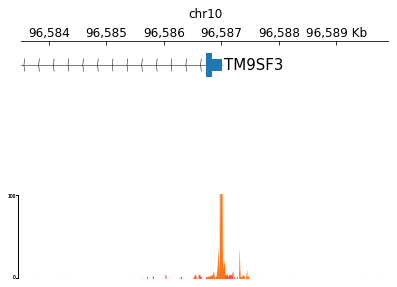

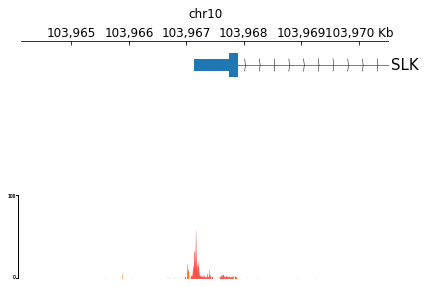

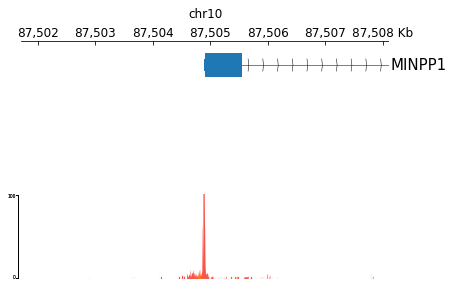

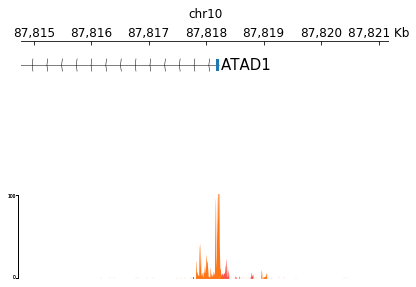

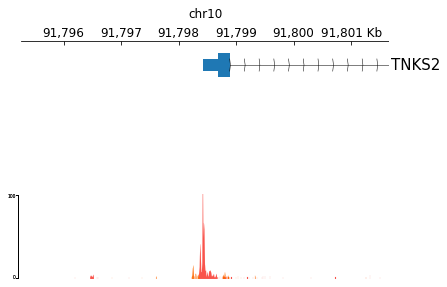

In [31]:
#plot gene annotations for the same sites
browser_tracks = """
[x-axis]
where = top
fontsize = 12
[spacer]
height = 0.05

[test gtf collapsed]
file = {ORCA_PATH}/resources/hg38.refGeneSelectMANE.bed.gz
height = 5
merge_transcripts = true
prefered_name = gene_name
max_labels = 10000
file_type = bed
gene_rows = 2
display = stacked
labels_in_margin = true
style = UCSC
arrow_interval = 10
fontsize = 15
title = 


[spacer]
height = 0.05

[bigwig file]
file = ./resources/FANTOM5_max_counts.le2.fwd.bw
# height of the track in cm (optional value)
height = 3
title = 
summary_method = max
file_type = bigwig
min_value = 0
max_value = 100
alpha = 0.9
color = #F94239

[bigwig file]
file = ./resources/FANTOM5_max_counts.le2.rev.bw
# height of the track in cm (optional value)
height = 3
title = 
summary_method = max
file_type = bigwig
overlay_previous = share-y
alpha = 0.9
color = #FF6800
""".format(ORCA_PATH=ORCA_PATH)


with open("/dev/shm/temp.ini", 'w') as fh:
    fh.write(browser_tracks)
for pos in compartment_a_activity_positions:

    regionstr = 'chr10:'+str(pos-3200)+'-'+str(pos+3200)

    import pygenometracks.plotTracks
    import uuid
    filename = str(uuid.uuid4())
    args = f"--tracks /dev/shm/temp.ini --region {regionstr} "\
           "--trackLabelFraction 0 --width 15 --dpi 600 "\
           f"--outFileName ./figures/compartment_activity.lengths.centered_examples.tss_{pos}.pdf".split()
    _ = pygenometracks.plotTracks.main(args)



In [33]:
#compare compartment activity at different insertion lengths 
from collections import defaultdict
j=225

model=hctnoc
with torch.no_grad():
    sequence = torch.FloatTensor(sequence_[None,:]).clone()
    sequence_rc = torch.FloatTensor(sequence_[None,::-1,::-1].copy()).clone()
    seqT = torch.Tensor(sequence.float()).transpose(1,2).cuda()
    seqT_rc = torch.Tensor(sequence_rc.float()).transpose(1,2).cuda()
    encoding0 = (model.net0)(seqT)
    encoding0_rc = (model.net0)(seqT_rc)

    def eval_step(level, start, coarse_pred=None, plot=False):
        distenc=torch.log(torch.FloatTensor(model.normmats[level][None,None,:,:]).cuda()).expand(sequence.shape[0],1,250,
    250)
        if coarse_pred is not None:
            pred = model.denets[level].forward(encodings[level][:,:,int(start/level):int(start/level)+250], distenc, coarse_pred)
        else:
            pred = model.denets[level].forward(encodings[level][:,:,int(start/level):int(start/level)+250], distenc)
        return pred

    start = 0
    encoding1, encoding2, encoding4, encoding8, encoding16, encoding32 = model.net(encoding0)
    encodings = {1: encoding1, 2: encoding2, 4: encoding4, 8:encoding8, 16:encoding16, 32:encoding32}
    pred32 = eval_step(32, start)
    encoding1, encoding2, encoding4, encoding8, encoding16, encoding32 = model.net(encoding0_rc)
    encodings = {1: encoding1, 2: encoding2, 4: encoding4, 8:encoding8, 16:encoding16, 32:encoding32}
    pred32_rc = torch.flip(eval_step(32, start),[2,3])
    
    for n in [51200, 25600, 12800, 6400, 3200,1600,800,400,200]:
        for j in [75, 225]:
            print(n,j)
            swapdiffs = []
            for k in range(int(32000000/n)):
                sequence2 = sequence.clone()
                sequence2[:,j*128000:(j)*128000+n,:]=sequence[:,k*n:(k+1)*n,:].clone()
                sequence2_rc = sequence_rc.clone()
                sequence2_rc[:,32000000-(j)*128000-n:32000000-j*128000:,:]=sequence_rc[:,32000000-(k+1)*n:32000000-k*n,:].clone()

                padding = 112000
                ind_padding = int(padding/4000)

                ind_s = int(np.ceil((j*128000-padding*2)/4000))
                ind_e = int(np.ceil(((j*128000+128000+padding*2)/4000)))

                seqT = torch.Tensor(sequence2[:,ind_s*4000:ind_e*4000,:].float()).transpose(1,2).cuda()
                seqT_rc = torch.Tensor(sequence2_rc[:,32000000-ind_e*4000:32000000-ind_s*4000,:].float()).transpose(1,2).cuda()
                encoding0_mut = encoding0.clone()
                encoding0_mut[:,:,ind_s+ind_padding:ind_e-ind_padding] = (model.net0)(seqT)[:,:,ind_padding:-ind_padding]

                encoding0_rc_mut = encoding0_rc.clone()
                encoding0_rc_mut[:,:,8000-ind_e+ind_padding:8000-ind_s-ind_padding] = (model.net0)(seqT_rc)[:,:,ind_padding:-ind_padding]


                def eval_step(level, start, coarse_pred=None, plot=False):
                    distenc=torch.log(torch.FloatTensor(model.normmats[level][None,None,:,:]).cuda()).expand(sequence.shape[0],1,250,
                250)
                    if coarse_pred is not None:
                        pred = model.denets[level].forward(encodings[level][:,:,int(start/level):int(start/level)+250], distenc, coarse_pred)
                    else:
                        pred = model.denets[level].forward(encodings[level][:,:,int(start/level):int(start/level)+250], distenc)

                    return pred

                start = 0
                encoding1, encoding2, encoding4, encoding8, encoding16, encoding32 = model.net(encoding0_mut)
                encodings = {1: encoding1, 2: encoding2, 4: encoding4, 8:encoding8, 16:encoding16, 32:encoding32}
                pred32_mut = eval_step(32, start)

                encoding1, encoding2, encoding4, encoding8, encoding16, encoding32 = model.net(encoding0_rc_mut)
                encodings = {1: encoding1, 2: encoding2, 4: encoding4, 8:encoding8, 16:encoding16, 32:encoding32}
                pred32_rc_mut = torch.flip(eval_step(32, start),[2,3])

                swapdiffs.append(torch.mean(torch.abs(0.5*pred32_mut[0,0,j,:]-0.5*pred32[0,0,j,:]+0.5*pred32_rc_mut[0,0,j,:]-0.5*pred32_rc[0,0,j,:])).item())
            swapdiffs_all[n][j].append(swapdiffs)
            
torch.save(dict(swapdiffs_all), './figure_data/swapdiff_lengthscreen.pth')

In [34]:
import pandas as pd
swapdiffs_all = torch.load('./figure_data/swapdiff_lengthscreen.pth')

c_scores = []
c_pos = []
c_len = []
c_target = []
for k in [51200, 25600,12800, 6400, 3200,1600,800,400,200]:
    for t in range(int(32000000/k)):
        c_pos.append(t*k+k/2)
        c_len.append(k)
        c_target.append(75)
    c_scores.extend(swapdiffs_all[k][75][0])
    for t in range(int(32000000/k)):
        c_pos.append(t*k+k/2)
        c_len.append(k)
        c_target.append(225)
    c_scores.extend(swapdiffs_all[k][225][0])
plotdata = pd.DataFrame(dict(score=c_scores, pos=c_pos, len=c_len, target=c_target))

In [35]:
import pandas as pd
for k in [51200, 25600,12800, 6400, 3200,1600,800,400,200]:
    for j in [75, 225]:
        pd.DataFrame({'chr': np.repeat('chr10', len(swapdiffs_all[k][j][0])),\
         'start':93072000-16000000 + np.arange(len(swapdiffs_all[k][j][0]))*k,\
         'end':93072000-16000000 + np.arange(1, len(swapdiffs_all[k][j][0])+1)*k,\
        'score':  [i for i in swapdiffs_all[k][j][0]]
        }).to_csv('./figure_data/swapdiff_.'+str(j)+'.'+str(k)+'.bedgraph', sep='\t', header=None,index=False)

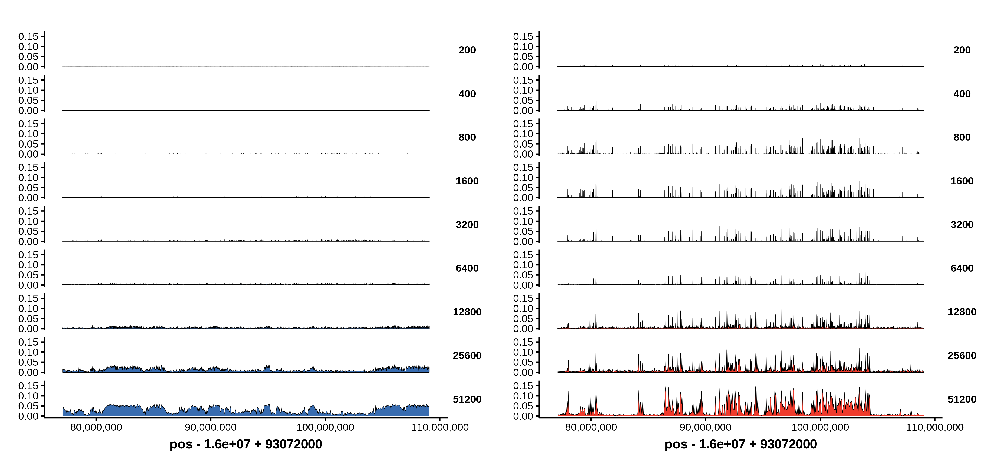

In [36]:
%%R -i plotdata -w 15 -h 7 --units in -r 300
#plot compartment activity profiles at different insertion length
theme_Publication <- function(base_size=14, base_family="Helvetica") {
      library(grid)
      library(ggthemes)
      (theme_foundation(base_size=base_size, base_family=base_family)
       + theme(plot.title = element_text(face = "bold",
                                         size = rel(1.2), hjust = 0.5),
               text = element_text(),
               panel.background = element_rect(colour = NA),
               plot.background = element_rect(colour = NA),
               panel.border = element_rect(colour = NA),
               axis.title = element_text(face = "bold",size = rel(1)),
               axis.title.y = element_text(angle=90,vjust =2),
               axis.title.x = element_text(vjust = -0.2),
               axis.text = element_text(), 
               axis.line = element_line(colour="black"),
               axis.ticks = element_line(),
               panel.grid.major = element_blank(),
               panel.grid.minor = element_blank(),
               legend.key = element_rect(colour = NA),
               legend.position = "bottom",
               legend.direction = "horizontal",
               legend.key.size= unit(0.2, "cm"),
               legend.margin = unit(0, "cm"),
               legend.title = element_text(face="italic"),
               plot.margin=unit(c(10,5,5,5),"mm"),
               strip.background=element_rect(colour="#ffffff",fill="#ffffff"),
               strip.text = element_text(face="bold")
          ))
      
}



require(ggplot2)
require(ggridges)
require(ggrastr)
require(scales)
require(data.table)
require(patchwork)
plotdata = data.table(plotdata)
#workaround for illustrator limit to max anchor points
plotdata$group = factor(as.integer(plotdata$pos / (plotdata$len*30000)))
plotdata$len = factor(plotdata$len)

p1 = ggplot(plotdata[target==75,])+geom_ribbon(aes(x=pos-16000000+93072000, ymin=0, ymax=score, group= group),color=I('black'),fill=I("#386cb0"),size=I(0.2))+
theme_Publication()+facet_grid(len~.)+ylim(0,0.167)+scale_x_continuous(label=comma)+theme(strip.text.y = element_text(angle=0))
p2 = ggplot(plotdata[target==225,])+geom_ribbon(aes(x=pos-16000000+93072000, ymin=0, ymax=score, group= group),color=I('black'),fill=I("#ef3b2c"),size=I(0.2))+
theme_Publication()+facet_grid(len~.)+ylim(0,0.167)+scale_x_continuous(label=comma)+theme(strip.text.y = element_text(angle=0))
p1 + p2
ggsave('./figures/compartment_activity.lengths.pdf',device = cairo_pdf)
p1 + p2

In [37]:
import tabix
sources=pd.read_csv('./virtual_screen/swapdiff.screen.list.v3.csv', index_col=0)

In [38]:
#load large-scale compartment activity screen results (across all three holdout chromosomes chr8, 9, 10),
#if you wish, you can follow instruction and code under ./virtual_screen to generate the screen results
#and the output will be saved at ./virtual_screen/compartment_activity_outputs/ directory

import pandas as pd
import glob 
import numpy as np

files = sorted(glob.glob('./figure_data/compartment_activity_outputs/target.*.bedgraph'))
eais = []
for f in files:
    a=pd.read_table(f, sep='\t',header=None)
    eais.append(a[3].values)
eais=np.vstack(eais)

In [39]:
#Load FANTOM TSS signal for comparison
import pyBigWig

pbw = pyBigWig.open("./resources/FANTOM5_max_counts.le2.fwd.bw")
mbw = pyBigWig.open("./resources/FANTOM5_max_counts.le2.rev.bw")


k=0
eaismean = np.mean(eais, axis=1)[:,None]
atssp = np.zeros(a.shape[0]) * np.nan
atssm = np.zeros(a.shape[0]) * np.nan
for i in range(a.shape[0]):
    try:
        bwvalues =  np.array(pbw.stats(sources.iloc[i,0],int(sources.iloc[i,1]), int(sources.iloc[i,2]), type="sum", exact=True)).astype(float)
        atssp[i]=np.sum(bwvalues)
        
        bwvalues =  np.array(mbw.stats(sources.iloc[i,0],int(sources.iloc[i,1]), int(sources.iloc[i,2]), type="sum", exact=True)).astype(float)
        atssm[i]=np.sum(bwvalues)
    except:
        pass

In [40]:
#correlation of each compartment activity profile (one per target site) with plus and minus strand TSS activity at source positions
from scipy.stats import pearsonr
mcors = []
pcors = []
pmcors = []
for i in range(eais.shape[0]):
    isvalid = np.isfinite(eais[i,:]) * np.isfinite(np.log(atssp+1))
    pcors.append(pearsonr(eais[i,:][isvalid], np.log(atssp+1)[isvalid])[0])
    
    isvalid = np.isfinite(eais[i,:]) * np.isfinite(np.log(atssm+1))
    mcors.append(pearsonr(eais[i,:][isvalid], np.log(atssm+1)[isvalid])[0])
    
    isvalid = np.isfinite(eais[i,:]) * np.isfinite(np.log(atssm+atssp+1))
    pmcors.append(pearsonr(eais[i,:][isvalid], np.log(atssm+atssp+1)[isvalid])[0])

pcors = np.array(pcors)
mcors = np.array(mcors)

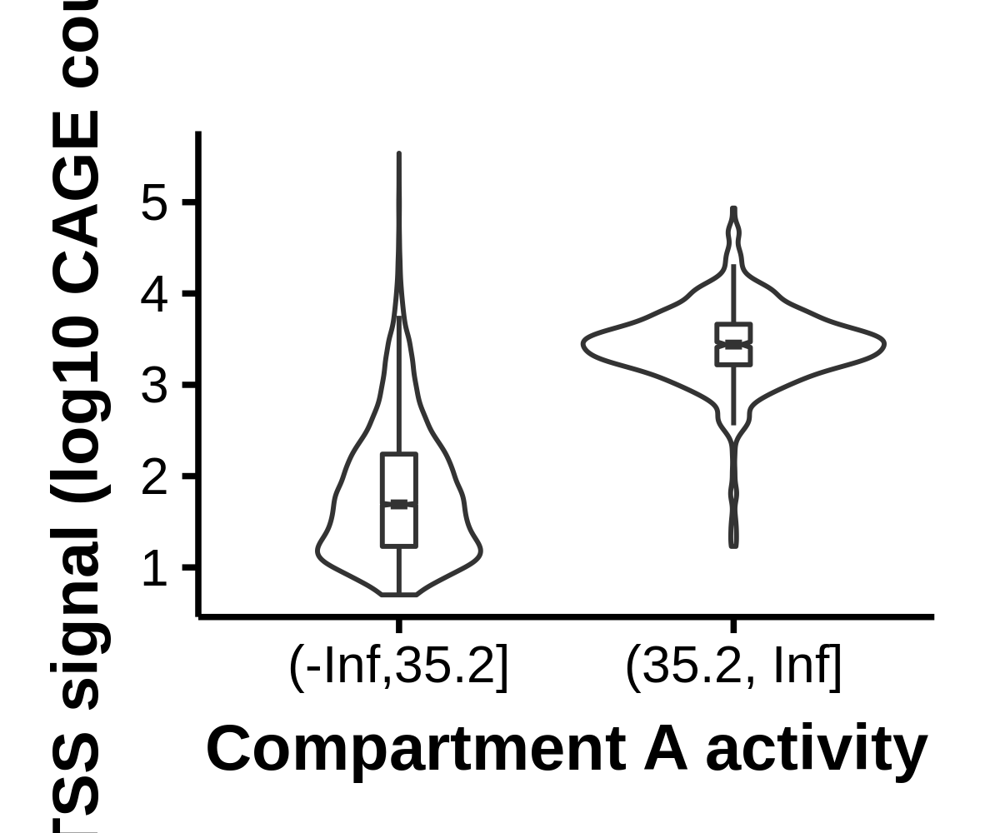

In [41]:
%%R -i atssp,atssm,eais -w 3 -h 2.5 --units in -r 400  -o pcorder,pc1
#compare TSS activities between sequences with and without strong compartment A activity

eais = t(scale(t(eais)))

eais.pc = prcomp(t(eais))
pcorder = sort(eais.pc$rotation[,1],index.return=T)$ix
pc1 = eais.pc$x[,1]

require(patchwork)

theme_Publication <- function(base_size=14, base_family="Helvetica") {
      library(grid)
      library(ggthemes)
      (theme_foundation(base_size=base_size, base_family=base_family)
       + theme(plot.title = element_text(face = "bold",
                                         size = rel(1.2), hjust = 0.5),
               text = element_text(),
               panel.background = element_rect(colour = NA),
               plot.background = element_rect(colour = NA),
               panel.border = element_rect(colour = NA),
               axis.title = element_text(face = "bold",size = rel(1)),
               axis.title.y = element_text(angle=90,vjust =2),
               axis.title.x = element_text(vjust = -0.2),
               axis.text = element_text(), 
               axis.line = element_line(colour="black"),
               axis.ticks = element_line(),
               panel.grid.major = element_blank(),
               panel.grid.minor = element_blank(),
               legend.key = element_rect(colour = NA),
               legend.position = "bottom",
               legend.direction = "horizontal",
               legend.key.size= unit(0.2, "cm"),
               legend.margin = unit(0, "cm"),
               legend.title = element_text(face="italic"),
               plot.margin=unit(c(10,5,5,5),"mm"),
               strip.background=element_rect(colour="#ffffff",fill="#ffffff"),
               strip.text = element_text(face="bold")
          ))
      
}
p1 = ggplot(data=data.frame(x= pc1, y=log10(atssm+atssp+1)),aes(x= cut(pc1, breaks=c(-Inf, quantile(pc1,0.98),Inf)), y=y))+
    geom_violin()+ geom_boxplot(width=0.1,notch=T,outlier.shape = NA)+
theme_Publication()+ylab('TSS signal (log10 CAGE count)')+xlab('Compartment A activity')
p1
ggsave('./figures/compartment_activity.maxcagesignal.pdf',device = cairo_pdf)

p1

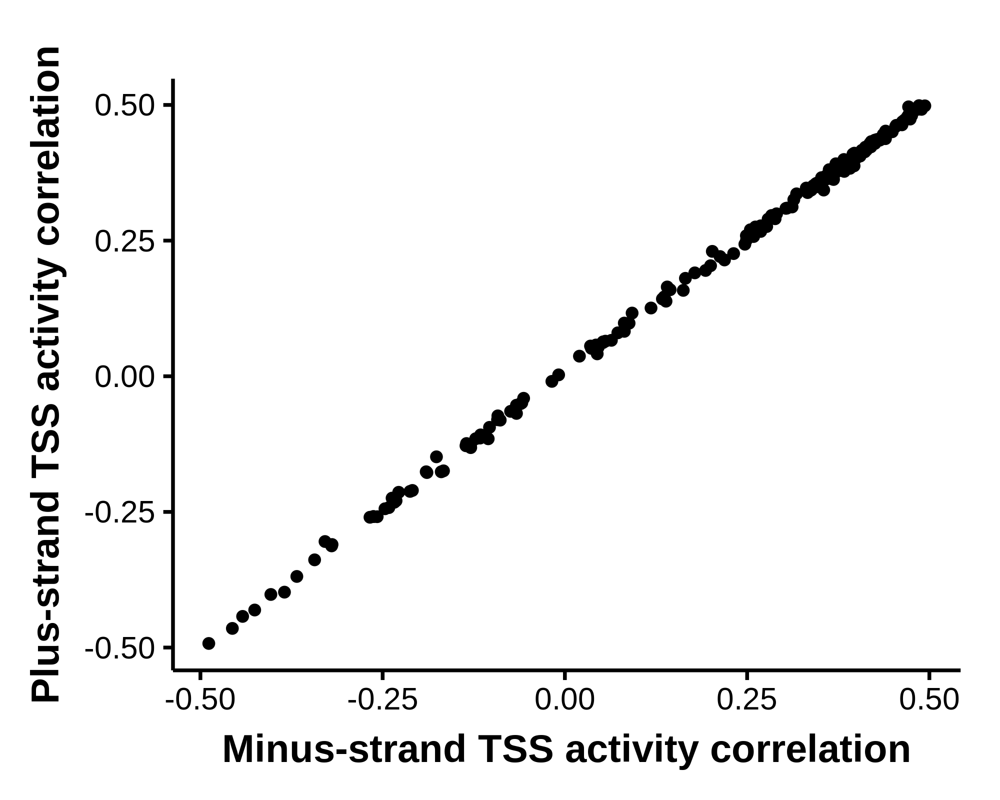

In [42]:
%%R -i pcors,mcors -w 5 -h 4 --units in -r 400 
#compare plus and minus strand correlation for each target site - no apparent strand specificity is observed
theme_Publication <- function(base_size=14, base_family="Helvetica") {
      library(grid)
      library(ggthemes)
      (theme_foundation(base_size=base_size, base_family=base_family)
       + theme(plot.title = element_text(face = "bold",
                                         size = rel(1.2), hjust = 0.5),
               text = element_text(),
               panel.background = element_rect(colour = NA),
               plot.background = element_rect(colour = NA),
               panel.border = element_rect(colour = NA),
               axis.title = element_text(face = "bold",size = rel(1)),
               axis.title.y = element_text(angle=90,vjust =2),
               axis.title.x = element_text(vjust = -0.2),
               axis.text = element_text(), 
               axis.line = element_line(colour="black"),
               axis.ticks = element_line(),
               panel.grid.major = element_blank(),
               panel.grid.minor = element_blank(),
               legend.key = element_rect(colour = NA),
               legend.position = "bottom",
               legend.direction = "horizontal",
               legend.key.size= unit(0.2, "cm"),
               legend.margin = unit(0, "cm"),
               legend.title = element_text(face="italic"),
               plot.margin=unit(c(10,5,5,5),"mm"),
               strip.background=element_rect(colour="#ffffff",fill="#ffffff"),
               strip.text = element_text(face="bold")
          ))
      
}

require(patchwork)
p1=ggplot(data=data.frame(x= pcors, y=mcors),aes(x=x,y=y))+geom_point()+
theme_Publication()+ylab('Plus-strand TSS activity correlation')+xlab('Minus-strand TSS activity correlation')
p1
ggsave('./figures/compartment_activity.strandspecificity.pdf',device = cairo_pdf)
p1

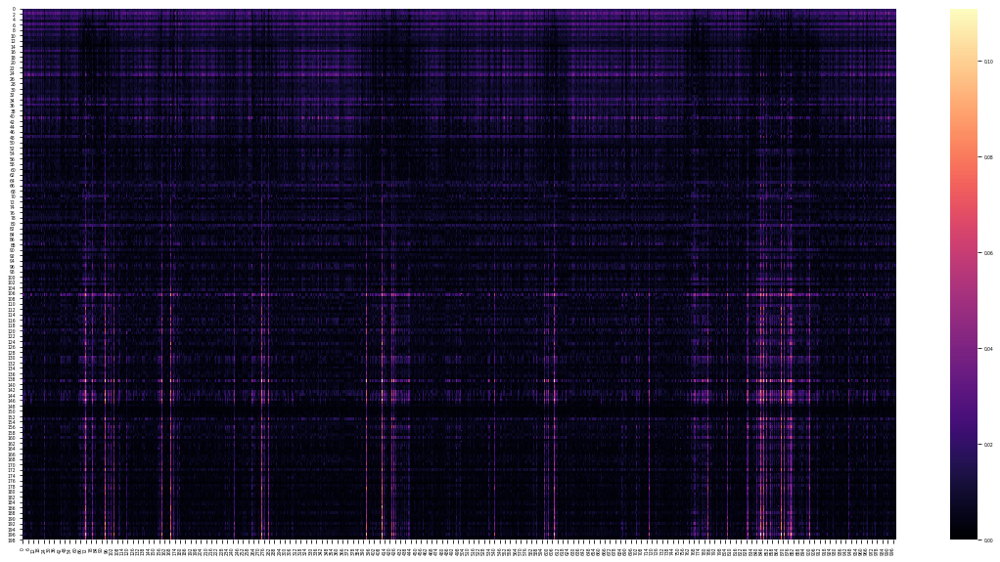

In [43]:
#visualize a segment of compartment activity matrix (source positions x targets) in the genome coordinate order
import seaborn
figsize(20,10)
seaborn.heatmap(eais[pcorder-1,3500:4500],cmap='magma')
plt.savefig('./figures/compartment_activity.largescreen.3.3500_4500.pdf')

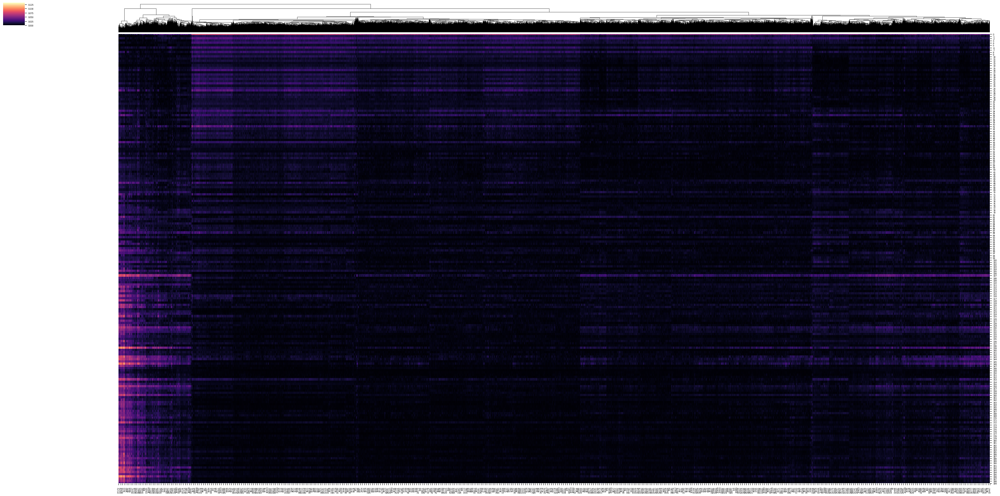

In [44]:
#visualize the whole compartment activity matrix, clustered (source positions x targets)

clustergrid = seaborn.clustermap(eais[pcorder-1,:],col_cluster=True, row_cluster=False,cmap='magma',figsize=(40,20),rasterized=True,metric='canberra')
plt.savefig('./figures/compartment_activity.largescreen.1.pdf')

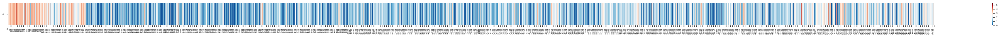

In [45]:
#visualize the TSS activities for the clustergram visualization
figsize(50,1)
tsslogp1 = np.log10(atssm+atssp+1)
tsslogp1[np.isnan(tsslogp1)]=0
seaborn.heatmap(tsslogp1[clustergrid.dendrogram_col.reordered_ind][None,:], cmap='RdBu_r',center=2.5)
plt.savefig('./figures/compartment_activity.largescreen.2.pdf')

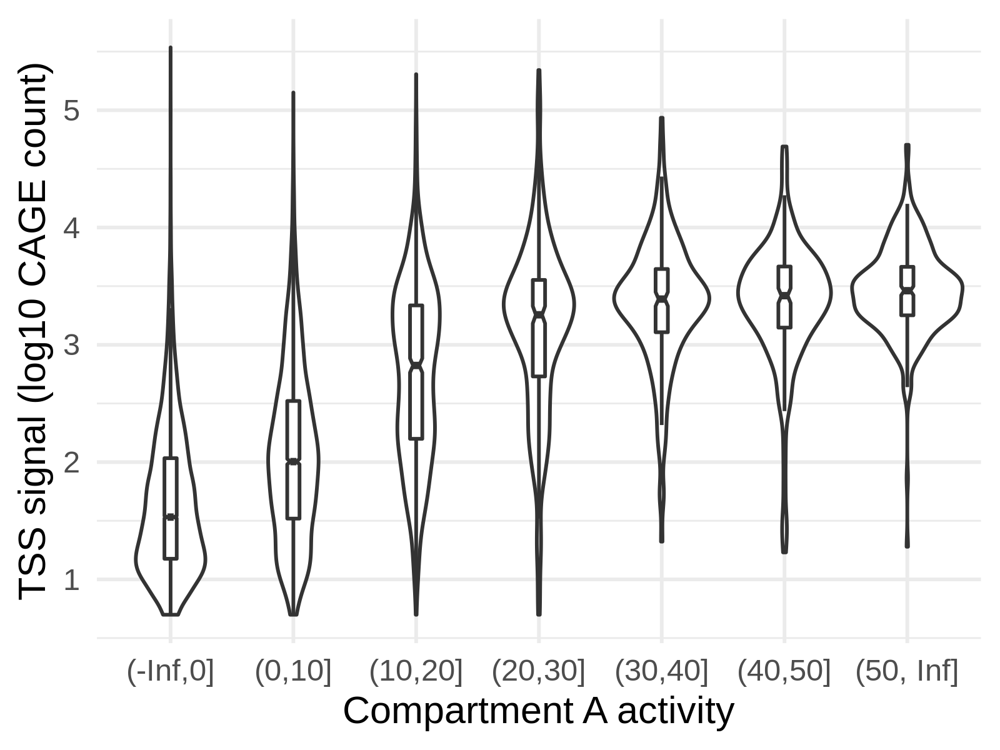

In [46]:
%%R -i atssp,atssm,eais -w 4 -h 3 --units in -r 400  -o pcorder,pc1
#plot compartment A activity vs TSS activities in multiple violin plots

require(ggplot2)
eais = t(scale(t(eais)))

eais.pc = prcomp(t(eais))
pcorder = sort(eais.pc$rotation[,1],index.return=T)$ix
pc1 = eais.pc$x[,1]

ggplot(data=data.frame(x= pc1, y=log10(atssm+atssp+1)),aes(x= cut(pc1, breaks=c(-Inf, 0,10,20,30,40,50,Inf)), y=y))+
    geom_violin()+ geom_boxplot(width=0.1,notch=T,outlier.shape = NA)+
theme_minimal()+ylab('TSS signal (log10 CAGE count)')+xlab('Compartment A activity')

In [47]:
import tabix 
import glob
#Load Ensembl release 97 annotations for comparison of subregions (merged by categories) 
afiles = sorted(glob.glob('./resources/Homo*.merged.bed.gz'))
alloverlaps = []
for f in afiles:
    tb = tabix.open(f)

    results = []
    for i in range(sources.shape[0]):
        try:
            r = list(tb.query(sources.iloc[i,0], sources.iloc[i,1], sources.iloc[i,2]))
            if len(r)>0:
                r = np.array(r)
                results.append(np.sum(np.clip(r[:,2].astype(int),a.iloc[i,1], a.iloc[i,2])-\
                                      np.clip(r[:,1].astype(int),a.iloc[i,1], a.iloc[i,2])))
            else:
                results.append(0)
        except:
            results.append(0)

    results = np.vstack(results)
    alloverlaps.append(results)
alloverlaps = np.hstack(alloverlaps)

In [48]:
from statsmodels.stats.contingency_tables import Table2x2
oddsratios = []
oddsratios_lo  = []
oddsratios_hi = []
for i in range(5):
    a1 = (alloverlaps[pc1>np.quantile(pc1,0.98),i]>0).sum()
    b1 = (alloverlaps[pc1>np.quantile(pc1,0.98),i]==0).sum()
    a2 = (alloverlaps[pc1<=np.quantile(pc1,0.98),i]>0).sum()
    b2 = (alloverlaps[pc1<=np.quantile(pc1,0.98),i]==0).sum()
    t = Table2x2([[a1,b1],[a2,b2]])
    oddsratios.append(t.oddsratio)
    lo_, hi_ = t.oddsratio_confint(0.05)
    oddsratios_lo.append(lo_)
    oddsratios_hi.append(hi_)
plotdata = pd.DataFrame(dict(fc = oddsratios, low = oddsratios_lo, high = oddsratios_hi, 
                             anno = ["3' UTR","5' UTR","Exon","Gene","TSS"]))

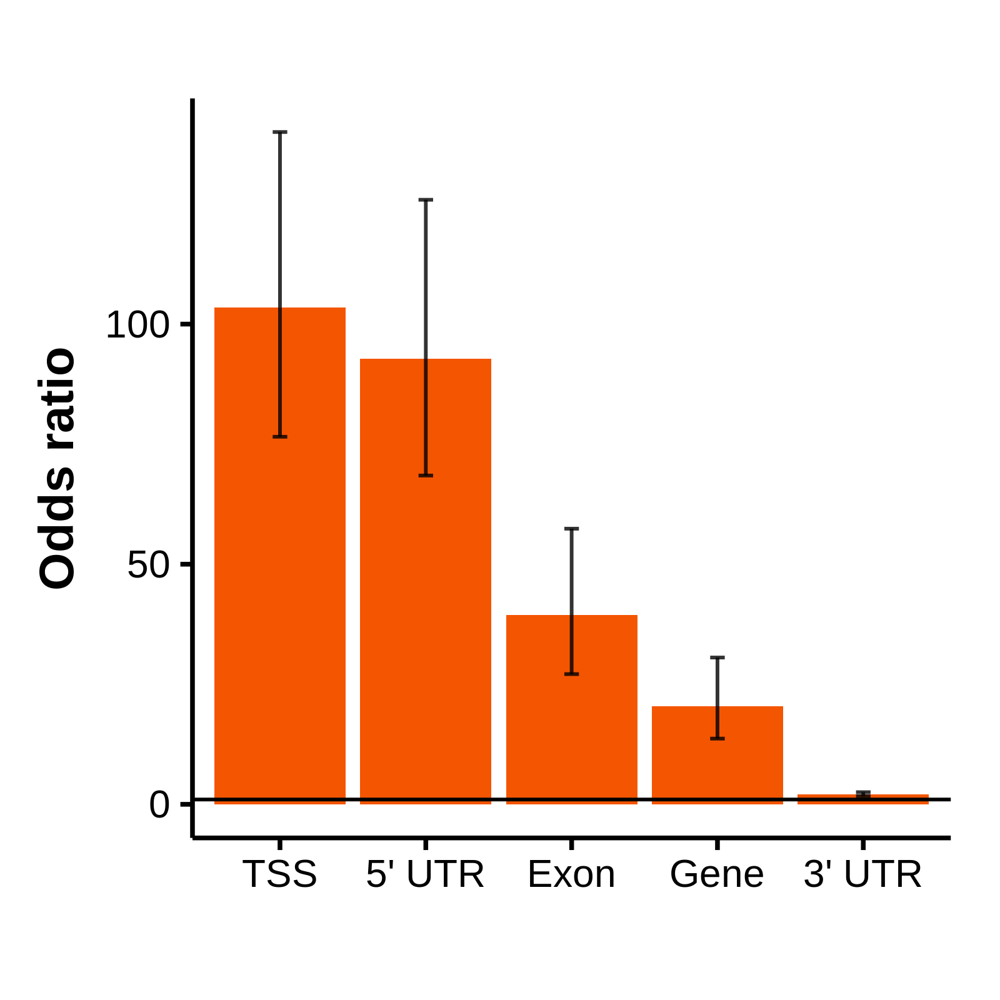

In [49]:
%%R -i plotdata -w 4 -h 4 --units in -r 400  
#plot odds ratio enrichment for overlap between compartment A activity and subgenic regions

require(patchwork)

theme_Publication <- function(base_size=14, base_family="Helvetica") {
      library(grid)
      library(ggthemes)
      (theme_foundation(base_size=base_size, base_family=base_family)
       + theme(plot.title = element_text(face = "bold",
                                         size = rel(1.2), hjust = 0.5),
               text = element_text(),
               panel.background = element_rect(colour = NA),
               plot.background = element_rect(colour = NA),
               panel.border = element_rect(colour = NA),
               axis.title = element_text(face = "bold",size = rel(1)),
               axis.title.y = element_text(angle=90,vjust =2),
               axis.title.x = element_text(vjust = -0.2),
               axis.text = element_text(), 
               axis.line = element_line(colour="black"),
               axis.ticks = element_line(),
               panel.grid.major = element_blank(),
               panel.grid.minor = element_blank(),
               legend.key = element_rect(colour = NA),
               legend.position = "bottom",
               legend.direction = "horizontal",
               legend.key.size= unit(0.2, "cm"),
               legend.margin = unit(0, "cm"),
               legend.title = element_text(face="italic"),
               plot.margin=unit(c(10,5,5,5),"mm"),
               strip.background=element_rect(colour="#ffffff",fill="#ffffff"),
               strip.text = element_text(face="bold")
          ))
      
}
plotdata$anno = factor(plotdata$anno, levels= c("TSS","5' UTR", "Exon", "Gene", "3' UTR"))
p=ggplot(plotdata)+geom_bar(aes(x=anno, y=fc), fill="#F45501", stat='identity')+theme_Publication()+
    geom_errorbar(aes(x=anno, y=fc, ymin=low, ymax=high), width=0.1,alpha=0.8)+
    geom_hline(yintercept=1)+xlab('')+ylab('Odds ratio')
p
ggsave('./figures/compartment_activity.geneannos.pdf',device = cairo_pdf)
p

In [50]:
import tabix 
#load chromatin state for HCT119 from Epimap
statedict = {
'EnhA1':0,
'EnhA2':1,
'EnhBiv':2,
'EnhG1':3,
'EnhG2':4,
'EnhWk':5,
'Het':6,
'Quies':7,
'ReprPC':8,
'ReprPCWk':9,
'TssA':10,
'TssBiv':11,
'TssFlnk':12,
'TssFlnkD':13,
'TssFlnkU':14,
'Tx':15,
'TxWk':16,
'ZNF/Rpts':17}

tb = tabix.open('./resources/BSS00492_18_CALLS_segments.bed.gz')


allstates = []
for i in range(a.shape[0]):
    states  = np.zeros(18)
    for results in list(tb.query(sources.iloc[i,0], sources.iloc[i,1], sources.iloc[i,2])):
        states[statedict[results[3]]] = np.clip(int(results[2]), sources.iloc[i,1], sources.iloc[i,2]) -  \
                                        np.clip(int(results[1]), sources.iloc[i,1], sources.iloc[i,2])
    allstates.append(states)
allstates = np.vstack(allstates)    

In [51]:
indstatedict = {statedict[key]:key for key in statedict}

In [52]:
def odds(x):
    return x/(1-x)
plotdata = pd.DataFrame(dict(fc = odds((allstates[pc1>np.quantile(pc1,0.98),:]>0).mean(axis=0)) / odds((allstates>0).mean(axis=0)),
                             anno = statedict.keys()))

In [53]:
from statsmodels.stats.contingency_tables import Table2x2
oddsratios = []
oddsratios_lo  = []
oddsratios_hi = []
for i in range(18):
    a1 = (allstates[pc1>np.quantile(pc1,0.98),i]>0).sum()
    b1 = (allstates[pc1>np.quantile(pc1,0.98),i]==0).sum()
    a2 = (allstates[pc1<=np.quantile(pc1,0.98),i]>0).sum()
    b2 = (allstates[pc1<=np.quantile(pc1,0.98),i]==0).sum()
    t = Table2x2([[a1,b1],[a2,b2]])
    oddsratios.append(t.oddsratio)
    lo_, hi_ = t.oddsratio_confint(0.05)
    oddsratios_lo.append(lo_)
    oddsratios_hi.append(hi_)
plotdata = pd.DataFrame(dict(fc = oddsratios, low = oddsratios_lo, high = oddsratios_hi, 
                             anno = ['Active Enhancer 1', 'Active Enhancer 2', 'Bivalent Enhancer', 
                                     'Genic enhancer1', 'Genic enhancer2', 'Weak Enhancer', 'Heterochromatin',
                                     'Quiescent/Low', 'Repressed PolyComb', 'Weak Repressed PolyComb', 
                                     'Active TSS', 'Bivalent/Poised TSS', 'Flanking TSS', 'Flanking TSS Downstream',
                                     'Flanking TSS Upstream', 'Strong transcription', 'Weak transcription', 
                                     'ZNF genes & repeats']))

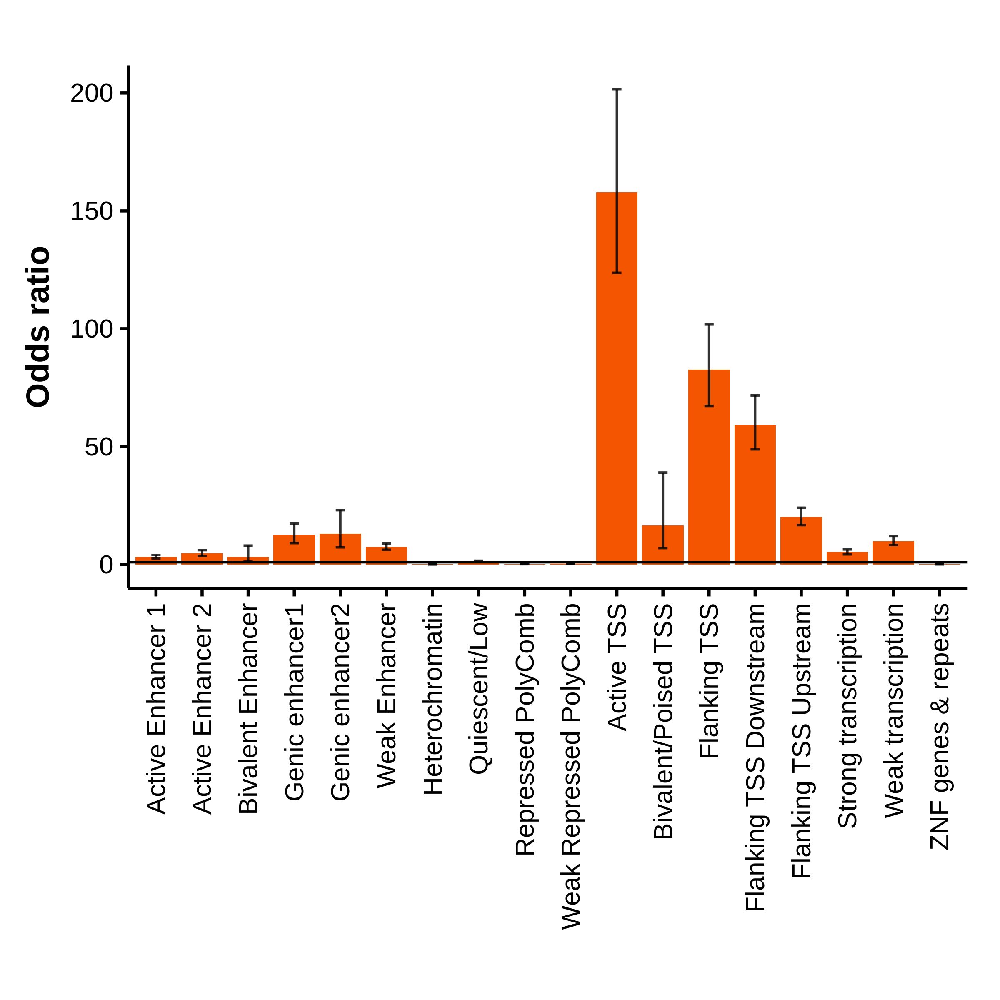

In [54]:
%%R -i plotdata -w 6 -h 6 --units in -r 400  
#plot odds ratio enrichment for overlap between compartment A activity and chromatin states 

require(patchwork)

theme_Publication <- function(base_size=14, base_family="Helvetica") {
      library(grid)
      library(ggthemes)
      (theme_foundation(base_size=base_size, base_family=base_family)
       + theme(plot.title = element_text(face = "bold",
                                         size = rel(1.2), hjust = 0.5),
               text = element_text(),
               panel.background = element_rect(colour = NA),
               plot.background = element_rect(colour = NA),
               panel.border = element_rect(colour = NA),
               axis.title = element_text(face = "bold",size = rel(1)),
               axis.title.y = element_text(angle=90,vjust =2),
               axis.title.x = element_text(vjust = -0.2),
               axis.text = element_text(), 
               axis.line = element_line(colour="black"),
               axis.ticks = element_line(),
               panel.grid.major = element_blank(),
               panel.grid.minor = element_blank(),
               legend.key = element_rect(colour = NA),
               legend.position = "bottom",
               legend.direction = "horizontal",
               legend.key.size= unit(0.2, "cm"),
               legend.margin = unit(0, "cm"),
               legend.title = element_text(face="italic"),
               plot.margin=unit(c(10,5,5,5),"mm"),
               strip.background=element_rect(colour="#ffffff",fill="#ffffff"),
               strip.text = element_text(face="bold")
          ))
      
}
plotdata$anno = factor(plotdata$anno, levels= plotdata$anno)
p=ggplot(plotdata)+geom_bar(aes(x=anno, y=fc), fill="#F45501", stat='identity')+theme_Publication()+
    geom_errorbar(aes(x=anno, y=fc, ymin=low, ymax=high), width=0.2,alpha=0.8)+
    geom_hline(yintercept=1)+xlab('')+
    ylab('Odds ratio')+
 theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))
p
ggsave('./figures/compartment_activity.18chromstateannos.pdf',device = cairo_pdf)
p

In [55]:
#binucleotide analysis
bidict = {"AA": [1,0,0,0,1,0,0,0],
 "AC": [1,0,0,0,0,1,0,0],
 "AG": [1,0,0,0,0,0,1,0],
 "AT": [1,0,0,0,0,0,0,1], 
 "CA": [0,1,0,0,1,0,0,0],
 "CC": [0,1,0,0,0,1,0,0],
 "CG": [0,1,0,0,0,0,1,0],
 "CT": [0,1,0,0,0,0,0,1], 
 "GA": [0,0,1,0,1,0,0,0],
 "GC": [0,0,1,0,0,1,0,0],
 "GG": [0,0,1,0,0,0,1,0],
 "GT": [0,0,1,0,0,0,0,1], 
 "TA": [0,0,0,1,1,0,0,0],
 "TC": [0,0,0,1,0,1,0,0],
 "TG": [0,0,0,1,0,0,1,0],
 "TT": [0,0,0,1,0,0,0,1], 
}
    

biprofiles = []
monoprofiles =  [] 
for i in range(a.shape[0]):
    s = hg38.get_encoding_from_coords(a.iloc[i,0], a.iloc[i,1], a.iloc[i,2])
    bis = np.vstack([np.hstack([s[:-1], s[1:]]), np.zeros(8)*np.nan])
    biprofile = []
    for b in sorted(bidict.keys()):
        biprofile.append(np.nanmean((bis==np.array(bidict[b])[None,:]).all(axis=1)))
    biprofiles.append(biprofile)
    monoprofiles.append(s.mean(axis=0))
    
bidict_i = {b:i for i, b in enumerate(sorted(bidict.keys()))}
monodict_i = {b:i for i, b in enumerate(['A','C','G','T'])}

biprofiles = np.array(biprofiles)
monoprofiles = np.array(monoprofiles)

biprofiled_reduced_ratio = np.vstack([
 (biprofiles[:, bidict_i['AA']]+biprofiles[:, bidict_i['TT']])/ (monoprofiles[:, monodict_i['A']] * monoprofiles[:, monodict_i['A']] + monoprofiles[:, monodict_i['T']] * monoprofiles[:, monodict_i['T']]),
 (biprofiles[:, bidict_i['AC']]+biprofiles[:, bidict_i['GT']])/ (monoprofiles[:, monodict_i['A']] * monoprofiles[:, monodict_i['C']] + monoprofiles[:, monodict_i['G']] * monoprofiles[:, monodict_i['T']]),
 (biprofiles[:, bidict_i['AG']]+biprofiles[:, bidict_i['CT']])/ (monoprofiles[:, monodict_i['A']] * monoprofiles[:, monodict_i['G']] + monoprofiles[:, monodict_i['C']] * monoprofiles[:, monodict_i['T']]),
 (biprofiles[:, bidict_i['AT']])/ (monoprofiles[:, monodict_i['A']] * monoprofiles[:, monodict_i['T']]),
 (biprofiles[:, bidict_i['CA']]+biprofiles[:, bidict_i['TG']])/ (monoprofiles[:, monodict_i['C']] * monoprofiles[:, monodict_i['A']] + monoprofiles[:, monodict_i['T']] * monoprofiles[:, monodict_i['G']]),
 (biprofiles[:, bidict_i['CC']]+biprofiles[:, bidict_i['GG']])/ (monoprofiles[:, monodict_i['C']] * monoprofiles[:, monodict_i['C']] + monoprofiles[:, monodict_i['G']] * monoprofiles[:, monodict_i['G']]),
 (biprofiles[:, bidict_i['CG']])/ (monoprofiles[:, monodict_i['C']] * monoprofiles[:, monodict_i['G']]),
 (biprofiles[:, bidict_i['GA']]+biprofiles[:, bidict_i['TC']])/ (monoprofiles[:, monodict_i['G']] * monoprofiles[:, monodict_i['A']] + monoprofiles[:, monodict_i['T']] * monoprofiles[:, monodict_i['C']]),
 (biprofiles[:, bidict_i['GC']])/ (monoprofiles[:, monodict_i['G']] * monoprofiles[:, monodict_i['C']]),
 (biprofiles[:, bidict_i['TA']])/ (monoprofiles[:, monodict_i['T']] * monoprofiles[:, monodict_i['A']])]).T

In [56]:
cor_binucleotide_compartmentB = np.corrcoef(biprofiled_reduced_ratio.T, eais[pcorder[:30]-1,:].mean(axis=0))[:10,-1]
cor_binucleotide_compartmentA = np.corrcoef(biprofiled_reduced_ratio.T, eais[pcorder[-30:]-1,:].mean(axis=0))[:10,-1]

In [57]:
monoprofiled_reduced = np.vstack([monoprofiles[:, monodict_i['A']] + monoprofiles[:, monodict_i['T']],
                                  monoprofiles[:, monodict_i['G']] + monoprofiles[:, monodict_i['C']]]).T
cor_mononucleotide_compartmentB = np.corrcoef(monoprofiled_reduced.T, eais[pcorder[:30]-1,:].mean(axis=0))[:2,-1]
cor_mononucleotide_compartmentA = np.corrcoef(monoprofiled_reduced.T, eais[pcorder[-30:]-1,:].mean(axis=0))[:2,-1]

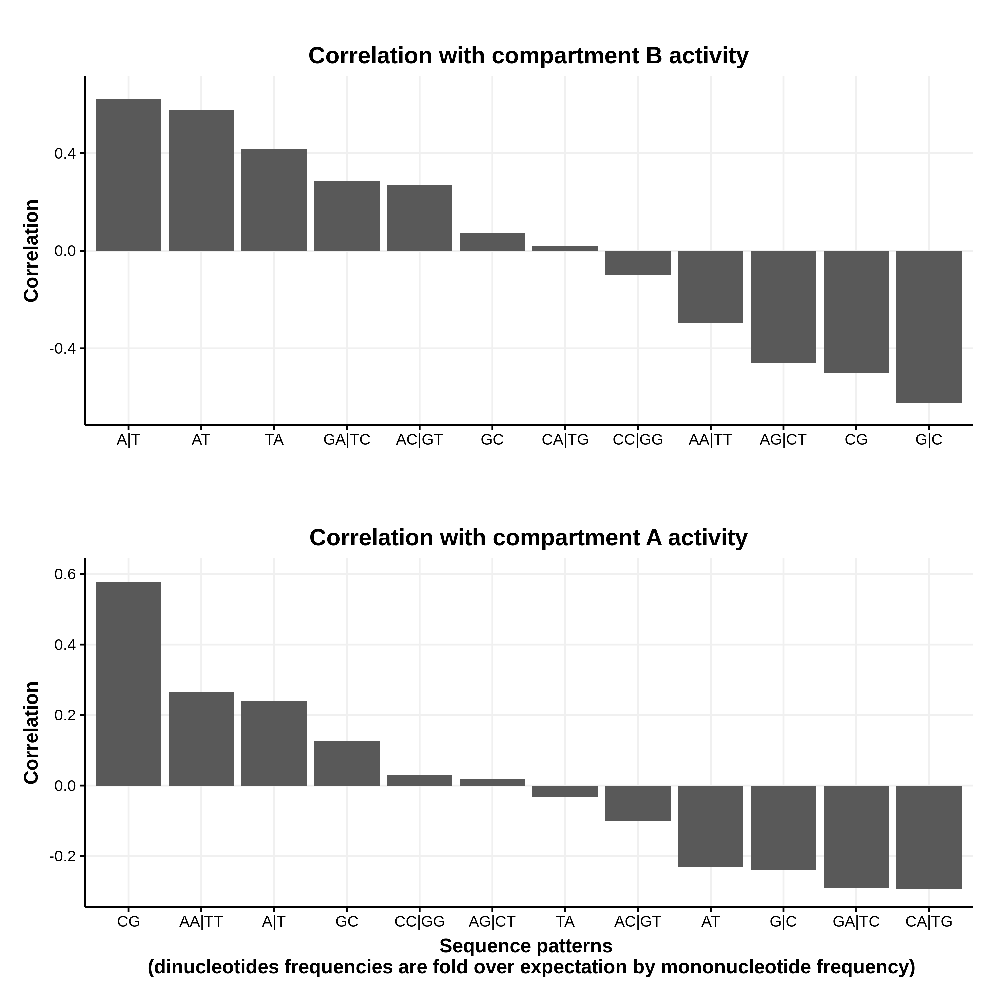

In [58]:
%%R -i cor_binucleotide_compartmentB,cor_binucleotide_compartmentA,cor_mononucleotide_compartmentB,cor_mononucleotide_compartmentA -w 10 -h 10 --units in -r 300
require(patchwork)
require(data.table)
require(ggplot2)
theme_Publication <- function(base_size=14, base_family="helvetica") {
      library(grid)
      library(ggthemes)
      (theme_foundation(base_size=base_size, base_family=base_family)
       + theme(plot.title = element_text(face = "bold",
                                         size = rel(1.2), hjust = 0.5),
               text = element_text(),
               panel.background = element_rect(colour = NA),
               plot.background = element_rect(colour = NA),
               panel.border = element_rect(colour = NA),
               axis.title = element_text(face = "bold",size = rel(1)),
               axis.title.y = element_text(angle=90,vjust =2),
               axis.title.x = element_text(vjust = -0.2),
               axis.text = element_text(), 
               axis.line = element_line(colour="black"),
               axis.ticks = element_line(),
               panel.grid.major = element_line(colour="#f0f0f0"),
               panel.grid.minor = element_blank(),
               legend.key = element_rect(colour = NA),
               legend.position = "bottom",
               legend.direction = "horizontal",
               legend.key.size= unit(0.2, "cm"),
               legend.margin = unit(0, "cm"),
               legend.title = element_text(face="italic"),
               plot.margin=unit(c(10,5,5,5),"mm"),
               strip.background=element_rect(colour="#f0f0f0",fill="#f0f0f0"),
               strip.text = element_text(face="bold")
          ))
      
}

plotdata=data.table(data.frame(cor = c(cor_binucleotide_compartmentB, cor_mononucleotide_compartmentB),
       di=c('AA|TT','AC|GT','AG|CT','AT','CA|TG','CC|GG','CG','GA|TC','GC','TA', 'A|T','G|C')))[order(-cor)]
plotdata$di = factor(plotdata$di, levels=plotdata$di)
p1=ggplot(plotdata)+geom_bar(aes(x=di,y=cor),stat='identity')+theme_Publication()+coord_cartesian(ylim=c(-0.65,0.65))+
    ggtitle('Correlation with compartment B activity')+ylab('Correlation')+xlab('')


plotdata=data.table(cor =c(cor_binucleotide_compartmentA, cor_mononucleotide_compartmentA),
       di=c('AA|TT','AC|GT','AG|CT','AT','CA|TG','CC|GG','CG','GA|TC','GC','TA', 'G|C','A|T'))[order(-cor)]
plotdata$di = factor(plotdata$di, levels=plotdata$di)
p2=ggplot(plotdata)+geom_bar(aes(x=di,y=cor),stat='identity')+theme_Publication()+coord_cartesian(ylim=c(-0.3,0.6))+
    ggtitle('Correlation with compartment A activity')+ylab('Correlation')+xlab('Sequence patterns \n (dinucleotides frequencies are fold over expectation by mononucleotide frequency)')

p1/p2
ggsave('./figures/compartment_dinucleotide_correlation.pdf', device=cairo_pdf)
p1/p2
